# Data Wrangling and Analyzing - Project 4
## Udacity Data Analyst Nanodegree
### by Sara Vicente


##  Table of Contents

<ul>
<li><a href="#Introduction">Introduction</a></li>
<li><a href="#Gathering Data">Gathering Data</a></li>
<li><a href="#Assessing Data">Assessing Data</a></li>
<li><a href="#Cleaning Data">Cleaning Data</a></li>
<li><a href="#Data Analysis">Data Analysis & Conclusions</a></li>
<li><a href="#Sources">Sources</a></li>
</ul>

<a id='Introduction'></a>
## INTRODUCTION

**By using Python** and its **libraries**, in this project, I will load in the data, check for cleanliness, and then trim and clean your dataset for analysis: 

- **Gather** data from three sources.
- **Assess** its quality and tidiness.
- **Clean** the data.

After wrangling the data I will **analyze** the dataset and get some **conclusions** about it.

<a id='Gathering Data'></a>
## GATHERING DATA 

The datasets I will use are the ones described below:

1. First, I will gather data from a **Twitter Archive** of the famous Twitter account **@dog_rates (WeRateDogs)**, in which users leave comments rating their dogs adding a funny comment to the rating. It is noteworthy that usually, the ratings have a denominator of 10 with numerators greater than this number, for example: 12/10.

2. Then, we will collect the **number of retweets** and the **number of favorites per tweet**, since this information is missing in our first dataset. I will obtain this information using **Tweepy** to query **Twitter's API.** 

3. The last dataset is contributed by Udacity, since the course instructor collected **images from the WeRateDogs archive** and **classified** them **by breed through neural networks.** Thus, I obtain a table with the predictions of each dog image, the tweet ID, the image URL and the image number that corresponds to the safest prediction.

In [1]:
# Import all the libraries that I will be using for this project
import pandas as pd
import numpy as np
import requests
import os
import re
import seaborn as sns
import matplotlib.pyplot as plt 
%matplotlib inline

### Twitter Archive

In [2]:
# Read the twitter-archive-enhanced.csv and import it into a DataFrame
pd.set_option('display.max_colwidth', -1) # This will set the no truncate for pandas as well as for dask.
df_twitter = pd.read_csv('twitter-archive-enhanced.csv')
df_twitter.head()

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643555336193/photo/1,13,10,Phineas,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421306343426/photo/1,13,10,Tilly,None,None,None,None
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Archie. He is a rare Norwegian Pouncing Corgo. Lives in the tall grass. You never know when one may strike. 12/10 https://t.co/wUnZnhtVJB,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891815181378084864/photo/1,12,10,Archie,None,None,None,None
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Darla. She commenced a snooze mid meal. 13/10 happens to the best of us https://t.co/tD36da7qLQ,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891689557279858688/photo/1,13,10,Darla,None,None,None,None
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Franklin. He would like you to stop calling him ""cute."" He is a very fierce shark and should be respected as such. 12/10 #BarkWeek https://t.co/AtUZn91f7f",NaN,NaN,NaN,"https://twitter.com/dog_rates/status/891327558926688256/photo/1,https://twitter.com/dog_rates/status/891327558926688256/photo/1",12,10,Franklin,None,None,None,None


### Twitter's API

I had some issues due to the current Covid-19 situation and it was not possible to get the approval for the Twitter's developper account as soon as I would have liked for this project, as it is taking them longer. Therefore I had tu use the data already provided by Udacity: (tweet_json.txt).

In [3]:
import tweepy
from tweepy import OAuthHandler
import json
from timeit import default_timer as timer

# Query Twitter API for each tweet in the Twitter archive and save JSON in a text file
# These are hidden to comply with Twitter's API terms and conditions
consumer_key = 'HIDEN'
consumer_secret = 'HIDEN'
access_token = 'HIDEN'
access_secret = 'HIDEN'

auth = OAuthHandler(consumer_key, consumer_secret)
auth.set_access_token(access_token, access_secret)

api = tweepy.API(auth, wait_on_rate_limit=True)

# NOTE TO STUDENT WITH MOBILE VERIFICATION ISSUES:
# df_1 is a DataFrame with the twitter_archive_enhanced.csv file. You may have to
# change line 17 to match the name of your DataFrame with twitter_archive_enhanced.csv
# NOTE TO REVIEWER: this student had mobile verification issues so the following
# Twitter API code was sent to this student from a Udacity instructor
# Tweet IDs for which to gather additional data via Twitter's API
tweet_ids = df_twitter.tweet_id.values
len(tweet_ids)

# Query Twitter's API for JSON data for each tweet ID in the Twitter archive
count = 0
fails_dict = {}
start = timer()
# Save each tweet's returned JSON as a new line in a .txt file
with open('tweet_json.txt', 'w') as outfile:
    # This loop will likely take 20-30 minutes to run because of Twitter's rate limit
    for tweet_id in tweet_ids:
        count += 1
        print(str(count) + ": " + str(tweet_id))
        try:
            tweet = api.get_status(tweet_id, tweet_mode='extended')
            print("Success")
            json.dump(tweet._json, outfile)
            outfile.write('\n')
        except tweepy.TweepError as e:
            print("Fail")
            fails_dict[tweet_id] = e
            pass
end = timer()
print(end - start)
print(fails_dict)

1: 892420643555336193
Fail
2: 892177421306343426
Fail
3: 891815181378084864
Fail
4: 891689557279858688
Fail
5: 891327558926688256
Fail
6: 891087950875897856
Fail
7: 890971913173991426
Fail
8: 890729181411237888
Fail
9: 890609185150312448
Fail
10: 890240255349198849
Fail
11: 890006608113172480
Fail
12: 889880896479866881
Fail
13: 889665388333682689
Fail
14: 889638837579907072
Fail
15: 889531135344209921
Fail
16: 889278841981685760
Fail
17: 888917238123831296
Fail
18: 888804989199671297
Fail
19: 888554962724278272
Fail
20: 888202515573088257
Fail
21: 888078434458587136
Fail
22: 887705289381826560
Fail
23: 887517139158093824
Fail
24: 887473957103951883
Fail
25: 887343217045368832
Fail
26: 887101392804085760
Fail
27: 886983233522544640
Fail
28: 886736880519319552
Fail
29: 886680336477933568
Fail
30: 886366144734445568
Fail
31: 886267009285017600
Fail
32: 886258384151887873
Fail
33: 886054160059072513
Fail
34: 885984800019947520
Fail
35: 885528943205470208
Fail
36: 885518971528720385
Fail
3

In [4]:
# Read the JSON archive and create a DataFrame with the information needed
df_tw_json = open('tweet-json.txt', 'r')
df_twitter_counts = pd.DataFrame(columns=['tweet_id', 'retweets', 'favorites'])

for line in df_tw_json:
    tweet = json.loads(line)
    df_twitter_counts = df_twitter_counts.append({'tweet_id': tweet['id'],
                                                  'retweets': tweet['retweet_count'],
                                                  'favorites': tweet['favorite_count']},
                                                 ignore_index=True)
df_tw_json.close()

df_twitter_counts

,tweet_id,retweets,favorites
0,892420643555336193,8853,39467
1,892177421306343426,6514,33819
2,891815181378084864,4328,25461
3,891689557279858688,8964,42908
4,891327558926688256,9774,41048
5,891087950875897856,3261,20562
6,890971913173991426,2158,12041
7,890729181411237888,16716,56848
8,890609185150312448,4429,28226
9,890240255349198849,7711,32467


### Image Predictions

In [5]:
# Download programatically the image prediction file using the link provided by Udacity
url = 'https://d17h27t6h515a5.cloudfront.net/topher/2017/August/599fd2ad_image-predictions/image-predictions.tsv'
r = requests.get(url, allow_redirects=True)

with open('image-predictions.tsv', mode ='wb') as file:
    file.write(r.content)
    
# Read and display the data from the image predictions file
df_img_pred = pd.read_csv('image-predictions.tsv', sep = '\t')
df_img_pred.head()

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,0.156665,True,Shetland_sheepdog,0.061428,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,0.074192,True,Rhodesian_ridgeback,0.072010,True
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German_shepherd,0.596461,True,malinois,0.138584,True,bloodhound,0.116197,True
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian_ridgeback,0.408143,True,redbone,0.360687,True,miniature_pinscher,0.222752,True
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,miniature_pinscher,0.560311,True,Rottweiler,0.243682,True,Doberman,0.154629,True


<a id='Assessing Data'></a>
## ASSESSING DATA


First of all I will **display the original datasets' first rows** and **get their information** to have an idea of what I will be wrangling.

In [6]:
df_twitter.head()

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643555336193/photo/1,13,10,Phineas,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421306343426/photo/1,13,10,Tilly,None,None,None,None
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Archie. He is a rare Norwegian Pouncing Corgo. Lives in the tall grass. You never know when one may strike. 12/10 https://t.co/wUnZnhtVJB,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891815181378084864/photo/1,12,10,Archie,None,None,None,None
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Darla. She commenced a snooze mid meal. 13/10 happens to the best of us https://t.co/tD36da7qLQ,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891689557279858688/photo/1,13,10,Darla,None,None,None,None
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Franklin. He would like you to stop calling him ""cute."" He is a very fierce shark and should be respected as such. 12/10 #BarkWeek https://t.co/AtUZn91f7f",NaN,NaN,NaN,"https://twitter.com/dog_rates/status/891327558926688256/photo/1,https://twitter.com/dog_rates/status/891327558926688256/photo/1",12,10,Franklin,None,None,None,None


In [7]:
df_twitter_counts.head()

,tweet_id,retweets,favorites
0,892420643555336193,8853,39467
1,892177421306343426,6514,33819
2,891815181378084864,4328,25461
3,891689557279858688,8964,42908
4,891327558926688256,9774,41048


In [8]:
df_img_pred.head()

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,0.156665,True,Shetland_sheepdog,0.061428,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,0.074192,True,Rhodesian_ridgeback,0.072010,True
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German_shepherd,0.596461,True,malinois,0.138584,True,bloodhound,0.116197,True
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian_ridgeback,0.408143,True,redbone,0.360687,True,miniature_pinscher,0.222752,True
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,miniature_pinscher,0.560311,True,Rottweiler,0.243682,True,Doberman,0.154629,True


In [9]:
# Get information about the columns entries and theur datatype
df_twitter.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2356 entries, 0 to 2355
Data columns (total 17 columns):
tweet_id                      2356 non-null int64
in_reply_to_status_id         78 non-null float64
in_reply_to_user_id           78 non-null float64
timestamp                     2356 non-null object
source                        2356 non-null object
text                          2356 non-null object
retweeted_status_id           181 non-null float64
retweeted_status_user_id      181 non-null float64
retweeted_status_timestamp    181 non-null object
expanded_urls                 2297 non-null object
rating_numerator              2356 non-null int64
rating_denominator            2356 non-null int64
name                          2356 non-null object
doggo                         2356 non-null object
floofer                       2356 non-null object
pupper                        2356 non-null object
puppo                         2356 non-null object
dtypes: float64(4), int64(3), ob

The **WeRateDogs Twitter archive** contains basic tweet data for all 5000+ of their tweets, but not everything. One column the archive does contain though: each tweet's text, which I used to extract rating, dog name, and dog "stage" (i.e. doggo, floofer, pupper, and puppo) to make this Twitter archive "enhanced." Of the 5000+ tweets, I have filtered for tweets with ratings only (there are 2356).


df_twitter (Twitter archive) columns:

- **tweet_id:** unique identifier for each tweet
- **in_reply_to_status_id:** if the represented Tweet is a reply, this field will contain the integer representation of the original Tweet’s ID
- **in_reply_to_user_id:** if the represented Tweet is a reply, this field will contain the integer representation of the original Tweet’s author ID
- **timestamp:** time when the Tweet was created
- **source:** utility used to post the Tweet
- **text:** actual UTF-8 text of the status update
- **retweeted_status_id:** if the represented Tweet is a retweet, this field will contain the integer representation of the original Tweet’s ID
- **retweeted_status_user_id:** if the represented Tweet is a retweet, this field will contain the integer representation of the original Tweet’s author ID
- **retweeted_status_timestamp:** time of retweet
- **expanded_urls:** tweet URL
- **rating_numerator:** numerator of the rating of a dog. Note: ratings almost always greater than 10
- **rating_denominator:** denominator of the rating of a dog. Note: ratings almost always have a denominator of 10
- **name:** name of the dog
- **doggo:** one of the 4 dog "stage"
- **floofer:** one of the 4 dog "stage"
- **pupper:** one of the 4 dog "stage"
- **puppo:** one of the 4 dog "stage"

In [10]:
df_twitter_counts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2354 entries, 0 to 2353
Data columns (total 3 columns):
tweet_id     2354 non-null object
retweets     2354 non-null object
favorites    2354 non-null object
dtypes: object(3)
memory usage: 55.2+ KB


In [11]:
df_img_pred.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075 entries, 0 to 2074
Data columns (total 12 columns):
tweet_id    2075 non-null int64
jpg_url     2075 non-null object
img_num     2075 non-null int64
p1          2075 non-null object
p1_conf     2075 non-null float64
p1_dog      2075 non-null bool
p2          2075 non-null object
p2_conf     2075 non-null float64
p2_dog      2075 non-null bool
p3          2075 non-null object
p3_conf     2075 non-null float64
p3_dog      2075 non-null bool
dtypes: bool(3), float64(3), int64(2), object(4)
memory usage: 152.1+ KB


**df_ing_pred** is a table full of image predictions (the top three only) alongside each tweet ID, image URL, and the image number that corresponded to the most confident prediction (numbered 1 to 4 since tweets can have up to four images)

- **tweet_id** is the last part of the tweet URL after "status/"
- **p1** is the algorithm's #1 prediction for the image in the tweet 
- **p1_conf** is how confident the algorithm is in its #1 prediction
- **p1_dog** is whether or not the #1 prediction is a breed of dog
- **p2** is the algorithm's second most likely prediction
- **p2_conf** is how confident the algorithm is in its #2 prediction 
- **p2_dog** is whether or not the #2 prediction is a breed of dog
- **p3** is the algorithm's second most likely prediction
- **p3_conf** is how confident the algorithm is in its #3 prediction 
- **p3_dog** is whether or not the #3 prediction is a breed of dog

In [12]:
# Check for nulls
df_twitter.isnull().sum()

tweet_id                      0   
in_reply_to_status_id         2278
in_reply_to_user_id           2278
timestamp                     0   
source                        0   
text                          0   
retweeted_status_id           2175
retweeted_status_user_id      2175
retweeted_status_timestamp    2175
expanded_urls                 59  
rating_numerator              0   
rating_denominator            0   
name                          0   
doggo                         0   
floofer                       0   
pupper                        0   
puppo                         0   
dtype: int64

In [13]:
df_twitter_counts.isnull().sum()

tweet_id     0
retweets     0
favorites    0
dtype: int64

In [14]:
df_img_pred.isnull().sum()

tweet_id    0
jpg_url     0
img_num     0
p1          0
p1_conf     0
p1_dog      0
p2          0
p2_conf     0
p2_dog      0
p3          0
p3_conf     0
p3_dog      0
dtype: int64

In [15]:
# Get some statistical insight of the dataset
df_twitter.describe()

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,retweeted_status_id,retweeted_status_user_id,rating_numerator,rating_denominator
count,2.356000e+03,7.800000e+01,7.800000e+01,1.810000e+02,1.810000e+02,2356.000000,2356.000000
mean,7.427716e+17,7.455079e+17,2.014171e+16,7.720400e+17,1.241698e+16,13.126486,10.455433
std,6.856705e+16,7.582492e+16,1.252797e+17,6.236928e+16,9.599254e+16,45.876648,6.745237
min,6.660209e+17,6.658147e+17,1.185634e+07,6.661041e+17,7.832140e+05,0.000000,0.000000
25%,6.783989e+17,6.757419e+17,3.086374e+08,7.186315e+17,4.196984e+09,10.000000,10.000000
50%,7.196279e+17,7.038708e+17,4.196984e+09,7.804657e+17,4.196984e+09,11.000000,10.000000
75%,7.993373e+17,8.257804e+17,4.196984e+09,8.203146e+17,4.196984e+09,12.000000,10.000000
max,8.924206e+17,8.862664e+17,8.405479e+17,8.874740e+17,7.874618e+17,1776.000000,170.000000


**Rating numerator:**
 - mean: 13.126486	
 - min: 0.000000	
 - max: 1776.000000	(this might be an error)

**Rating denominator:**
 - mean: 10.455433
 - min: 0.000000	
 - max: 170.000000	(this might be an error)

In [16]:
# How many retweets
sum(~df_twitter.retweeted_status_id.isnull())

181

In [17]:
# How many replies
sum(~df_twitter.in_reply_to_status_id.isnull())

78

In [18]:
# Check for duplicated twitter ids within the same dataframe
sum(df_twitter.tweet_id.duplicated()) 

0

In [19]:
sum(df_img_pred.tweet_id.duplicated())

0

In [20]:
sum(df_twitter_counts.tweet_id.duplicated())

0

In [21]:
# Check for unique values
df_twitter.nunique()

tweet_id                      2356
in_reply_to_status_id         77  
in_reply_to_user_id           31  
timestamp                     2356
source                        4   
text                          2356
retweeted_status_id           181 
retweeted_status_user_id      25  
retweeted_status_timestamp    181 
expanded_urls                 2218
rating_numerator              40  
rating_denominator            18  
name                          957 
doggo                         2   
floofer                       2   
pupper                        2   
puppo                         2   
dtype: int64

In [22]:
df_img_pred.nunique()

tweet_id    2075
jpg_url     2009
img_num     4   
p1          378 
p1_conf     2006
p1_dog      2   
p2          405 
p2_conf     2004
p2_dog      2   
p3          408 
p3_conf     2006
p3_dog      2   
dtype: int64

In [23]:
df_twitter_counts.nunique()

tweet_id     2354
retweets     1724
favorites    2007
dtype: int64

In [24]:
# Check for the different dog names in the twitter dataframe
df_twitter.name.value_counts()

None        745
a           55 
Charlie     12 
Oliver      11 
Lucy        11 
Cooper      11 
Lola        10 
Penny       10 
Tucker      10 
Winston     9  
Bo          9  
Sadie       8  
the         8  
Daisy       7  
an          7  
Toby        7  
Buddy       7  
Bailey      7  
Koda        6  
Jack        6  
Leo         6  
Dave        6  
Bella       6  
Jax         6  
Scout       6  
Milo        6  
Oscar       6  
Stanley     6  
Rusty       6  
George      5  
           ..  
Jay         1  
Brockly     1  
Olaf        1  
Marty       1  
Darrel      1  
Kevon       1  
Kloey       1  
Robin       1  
Blanket     1  
O           1  
Tuck        1  
Jo          1  
Iggy        1  
Carper      1  
Liam        1  
Bode        1  
Dallas      1  
Zooey       1  
Brady       1  
Shikha      1  
Banditt     1  
Stefan      1  
Lillie      1  
Tom         1  
Tove        1  
Winifred    1  
Simba       1  
Craig       1  
Goliath     1  
Livvie      1  
Name: name, Length: 957,

As we can already see there are some invalid names such as "None", "a", "an" or "By",let's take a deepest investigation on the name column and sort them by its first letter:

In [25]:
# Chech how many names are marked as "None"
len(df_twitter[df_twitter['name'] == "None"])

745

In [26]:
# Chech how many names are marked as "None"
df_twitter[(df_twitter['name']=='None')].text

5       Here we have a majestic great white breaching off South Africa's coast. Absolutely h*ckin breathtaking. 13/10 (IG: tucker_marlo) #BarkWeek https://t.co/kQ04fDDRmh   
7       When you watch your owner call another dog a good boy but then they turn back to you and say you're a great boy. 13/10 https://t.co/v0nONBcwxq                       
12      Here's a puppo that seems to be on the fence about something haha no but seriously someone help her. 13/10 https://t.co/BxvuXk0UCm                                   
24      You may not have known you needed to see this today. 13/10 please enjoy (IG: emmylouroo) https://t.co/WZqNqygEyV                                                     
25      This... is a Jubilant Antarctic House Bear. We only rate dogs. Please only send dogs. Thank you... 12/10 would suffocate in floof https://t.co/4Ad1jzJSdp            
30      @NonWhiteHat @MayhewMayhem omg hello tanner you are a scary good boy 12/10 would pet with extreme caution                 

In [27]:
np.sort(df_twitter.name.unique())

array(['Abby', 'Ace', 'Acro', 'Adele', 'Aiden', 'Aja', 'Akumi', 'Al',
       'Albert', 'Albus', 'Aldrick', 'Alejandro', 'Alexander',
       'Alexanderson', 'Alf', 'Alfie', 'Alfy', 'Alice', 'Amber', 'Ambrose',
       'Amy', 'Amélie', 'Anakin', 'Andru', 'Andy', 'Angel', 'Anna',
       'Anthony', 'Antony', 'Apollo', 'Aqua', 'Archie', 'Arlen', 'Arlo',
       'Arnie', 'Arnold', 'Arya', 'Ash', 'Asher', 'Ashleigh', 'Aspen',
       'Astrid', 'Atlas', 'Atticus', 'Aubie', 'Augie', 'Autumn', 'Ava',
       'Axel', 'Bailey', 'Baloo', 'Balto', 'Banditt', 'Banjo', 'Barclay',
       'Barney', 'Baron', 'Barry', 'Batdog', 'Bauer', 'Baxter', 'Bayley',
       'BeBe', 'Bear', 'Beau', 'Beckham', 'Beebop', 'Beemo', 'Bell',
       'Bella', 'Belle', 'Ben', 'Benedict', 'Benji', 'Benny', 'Bentley',
       'Berb', 'Berkeley', 'Bernie', 'Bert', 'Bertson', 'Betty', 'Beya',
       'Biden', 'Bilbo', 'Billl', 'Billy', 'Binky', 'Birf', 'Bisquick',
       'Blakely', 'Blanket', 'Blipson', 'Blitz', 'Bloo', 'Bloop', 'Blu',

There are some other **error names**: 'a', 'actually', 'all', 'an', 'by', 'getting', 'his',
       'incredibly', 'infuriating', 'just', 'life', 'light', 'mad', 'my',
       'not', 'officially', 'old', 'one', 'quite', 'space', 'such', 'the',
       'this', 'unacceptable' and 'very'.

In [28]:
# Check how many name starting with a lowercase
len(df_twitter.loc[(df_twitter['name'].str.islower())])

109

In [29]:
df_twitter.loc[(df_twitter['name'].str.islower())].loc[:,['name','text']]

,name,text
22,such,I've yet to rate a Venezuelan Hover Wiener. This is such an honor. 14/10 paw-inspiring af (IG: roxy.thedoxy) https://t.co/20VrLAA8ba
56,a,Here is a pupper approaching maximum borkdrive. Zooming at never before seen speeds. 14/10 paw-inspiring af \n(IG: puffie_the_chow) https://t.co/ghXBIIeQZF
118,quite,RT @dog_rates: We only rate dogs. This is quite clearly a smol broken polar bear. We'd appreciate if you only send dogs. Thank you... 12/10…
169,quite,We only rate dogs. This is quite clearly a smol broken polar bear. We'd appreciate if you only send dogs. Thank you... 12/10 https://t.co/g2nSyGenG9
193,quite,"Guys, we only rate dogs. This is quite clearly a bulbasaur. Please only send dogs. Thank you... 12/10 human used pet, it's super effective https://t.co/Xc7uj1C64x"
335,not,There's going to be a dog terminal at JFK Airport. This is not a drill. 10/10 \nhttps://t.co/dp5h9bCwU7
369,one,"Occasionally, we're sent fantastic stories. This is one of them. 14/10 for Grace https://t.co/bZ4axuH6OK"
542,incredibly,We only rate dogs. Please stop sending in non-canines like this Freudian Poof Lion. This is incredibly frustrating... 11/10 https://t.co/IZidSrBvhi
649,a,Here is a perfect example of someone who has their priorities in order. 13/10 for both owner and Forrest https://t.co/LRyMrU7Wfq
682,mad,RT @dog_rates: Say hello to mad pupper. You know what you did. 13/10 would pet until no longer furustrated https://t.co/u1ulQ5heLX


Filtering by names starting with lowercase, looks like there is an error with the name caching algorithm as it expected a name after phrases like: "This is", "Here is", "that is" or "Say hello to". As we can see in the majority of the sample texts of each tweets, the name doesn't show. Nevertheless, for some other tweet's texts, we can see the real name after phrases such as: 'Her name is', 'His name is', 'That is' and 'named'.

- index number 852 - This is my dog. **Her name is Zoey**... (name detected by the algorithm: my)
- index number 992 - **That is Quizno**. This is his beach...  (name detected by the algorithm: his)
- index number 2191 - This is a Slovakian Helter Skelter Feta **named Leroi**...  (name detected by the algorithm: a)
- index number 2249 - This is a Shotokon Macadamia mix **named Cheryl**... (name detected by the algorithm: a)
- index number 2255 - This is a rare Hungarian Pinot **named Jessiga** ... (name detected by the algorithm: a)
- index number 2264 - This is a southwest Coriander **named Klint**... (name detected by the algorithm: a)
- index number 2273 - This is a northern Wahoo **named Kohl**... (name detected by the algorithm: a)
- index number 2287 - This is a Dasani Kingfisher from Maine. **His name is Daryl**... (name detected by the algorithm: a) 
- index number 2304 - This is a curly Ticonderoga **named Pepe**... (name detected by the algorithm: a)
- index number 2311 - This is a purebred Bacardi **named Octaviath**... (name detected by the algorithm: a)
- index number 2314 - This is a This is a golden Buckminsterfullerene **named Johm**... (name detected by the algorithm: a) 



In [30]:
# Check the doggo stage
df_twitter.doggo.value_counts()

None     2259
doggo    97  
Name: doggo, dtype: int64

In [31]:
# Check the floofer stage
df_twitter.floofer.value_counts()

None       2346
floofer    10  
Name: floofer, dtype: int64

In [32]:
# Check the puppo stage
df_twitter.puppo.value_counts()

None     2326
puppo    30  
Name: puppo, dtype: int64

In [33]:
# Check the pupper stage
df_twitter.pupper.value_counts()

None      2099
pupper    257 
Name: pupper, dtype: int64

In [34]:
# Check if there are records with more than one "dog stage" for the same tweet_id

# Doggo and floofer
print("Number of records with both doggo and floofer stage", len(df_twitter[(df_twitter.doggo != 'None') & (df_twitter.floofer != 'None')]))
# Doggo and pupper
print("Number of records with both doggo and pupper stage", len(df_twitter[(df_twitter.doggo != 'None') & (df_twitter.pupper != 'None')]))
# Doggo and puppo
print("Number of records with both doggo and puppo stage", len(df_twitter[(df_twitter.doggo != 'None') & (df_twitter.puppo != 'None')]))
# floofer and pupper
print("Number of records with both floofer and pupper stage", len(df_twitter[(df_twitter.floofer != 'None') & (df_twitter.pupper != 'None')]))
# floofer and puppo
print("Number of records with both floofer and puppo stage", len(df_twitter[(df_twitter.floofer != 'None') & (df_twitter.puppo != 'None')]))
# pupper and puppo
print("Number of records with both pupper and puppo stage", len(df_twitter[(df_twitter.pupper != 'None') & (df_twitter.puppo != 'None')]))


Number of records with both doggo and floofer stage 1
Number of records with both doggo and pupper stage 12
Number of records with both doggo and puppo stage 1
Number of records with both floofer and pupper stage 0
Number of records with both floofer and puppo stage 0
Number of records with both pupper and puppo stage 0


Let's look deeper into the records with more than one stage:

In [35]:
# Check the tweet text
df_twitter[(df_twitter.doggo != 'None') & (df_twitter.floofer != 'None')]

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
200,854010172552949760,NaN,NaN,2017-04-17 16:34:26 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","At first I thought this was a shy doggo, but it's actually a Rare Canadian Floofer Owl. Amateurs would confuse the two. 11/10 only send dogs https://t.co/TXdT3tmuYk",NaN,NaN,NaN,"https://twitter.com/dog_rates/status/854010172552949760/photo/1,https://twitter.com/dog_rates/status/854010172552949760/photo/1",11,10,None,doggo,floofer,None,None


As can be read in the text, this dog is a Floofer.

In [36]:
df_twitter[(df_twitter.doggo != 'None') & (df_twitter.pupper != 'None')]

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
460,817777686764523521,NaN,NaN,2017-01-07 16:59:28 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Dido. She's playing the lead role in ""Pupper Stops to Catch Snow Before Resuming Shadow Box with Dried Apple."" 13/10 (IG: didodoggo) https://t.co/m7isZrOBX7",NaN,NaN,NaN,https://twitter.com/dog_rates/status/817777686764523521/video/1,13,10,Dido,doggo,None,pupper,None
531,808106460588765185,NaN,NaN,2016-12-12 00:29:28 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Here we have Burke (pupper) and Dexter (doggo). Pupper wants to be exactly like doggo. Both 12/10 would pet at same time https://t.co/ANBpEYHaho,NaN,NaN,NaN,https://twitter.com/dog_rates/status/808106460588765185/photo/1,12,10,None,doggo,None,pupper,None
565,802265048156610565,7.331095e+17,4.196984e+09,2016-11-25 21:37:47 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","Like doggo, like pupper version 2. Both 11/10 https://t.co/9IxWAXFqze",NaN,NaN,NaN,https://twitter.com/dog_rates/status/802265048156610565/photo/1,11,10,None,doggo,None,pupper,None
575,801115127852503040,NaN,NaN,2016-11-22 17:28:25 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Bones. He's being haunted by another doggo of roughly the same size. 12/10 deep breaths pupper everything's fine https://t.co/55Dqe0SJNj,NaN,NaN,NaN,"https://twitter.com/dog_rates/status/801115127852503040/photo/1,https://twitter.com/dog_rates/status/801115127852503040/photo/1",12,10,Bones,doggo,None,pupper,None
705,785639753186217984,NaN,NaN,2016-10-11 00:34:48 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Pinot. He's a sophisticated doggo. You can tell by the hat. Also pointier than your average pupper. Still 10/10 would pet cautiously https://t.co/f2wmLZTPHd,NaN,NaN,NaN,"https://twitter.com/dog_rates/status/785639753186217984/photo/1,https://twitter.com/dog_rates/status/785639753186217984/photo/1",10,10,Pinot,doggo,None,pupper,None
733,781308096455073793,NaN,NaN,2016-09-29 01:42:20 +0000,"<a href=""http://vine.co"" rel=""nofollow"">Vine - Make a Scene</a>","Pupper butt 1, Doggo 0. Both 12/10 https://t.co/WQvcPEpH2u",NaN,NaN,NaN,https://vine.co/v/5rgu2Law2ut,12,10,None,doggo,None,pupper,None
778,775898661951791106,NaN,NaN,2016-09-14 03:27:11 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","RT @dog_rates: Like father (doggo), like son (pupper). Both 12/10 https://t.co/pG2inLaOda",7.331095e+17,4.196984e+09,2016-05-19 01:38:16 +0000,"https://twitter.com/dog_rates/status/733109485275860992/photo/1,https://twitter.com/dog_rates/status/733109485275860992/photo/1",12,10,None,doggo,None,pupper,None
822,770093767776997377,NaN,NaN,2016-08-29 03:00:36 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",RT @dog_rates: This is just downright precious af. 12/10 for both pupper and doggo https://t.co/o5J479bZUC,7.410673e+17,4.196984e+09,2016-06-10 00:39:48 +0000,"https://twitter.com/dog_rates/status/741067306818797568/photo/1,https://twitter.com/dog_rates/status/741067306818797568/photo/1",12,10,just,doggo,None,pupper,None
889,759793422261743616,NaN,NaN,2016-07-31 16:50:42 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","Meet Maggie &amp; Lila. Maggie is the doggo, Lila is the pupper. They are sisters. Both 12/10 would pet at the same time https://t.co/MYwR4DQKll",NaN,NaN,NaN,"https://twitter.com/dog_rates/status/759793422261743616/photo/1,https://twitter.com/dog_rates/status/759793422261743616/photo/1",12,10,Maggie,doggo,Non

Looking at the text and also folowwing the link, I've determined if the tweets rate two dogs or one, getting for this last case its stage:

|tweet_id|2 dogs / 1 dog (Stage) |
|-----------------|------------|
| 817777686764523521    |	Pupper|
| 808106460588765185	|	2 dogs |
| 802265048156610565	|	2 dogs|
| 801115127852503040	|	Doggo|
| 785639753186217984	|	Doggo|
| 781308096455073793	|	2 dogs|
| 775898661951791106	|	2 dogs|
| 770093767776997377	|	2 dogs|
| 759793422261743616	|	2 dogs|
| 751583847268179968	|	doggo|
| 741067306818797568	|	2 dogs|
| 733109485275860992	|	2 dogs|


In [37]:
df_twitter[(df_twitter.doggo != 'None') & (df_twitter.puppo != 'None')]

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
191,855851453814013952,NaN,NaN,2017-04-22 18:31:02 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Here's a puppo participating in the #ScienceMarch. Cleverly disguising her own doggo agenda. 13/10 would keep the planet habitable for https://t.co/cMhq16isel,NaN,NaN,NaN,https://twitter.com/dog_rates/status/855851453814013952/photo/1,13,10,None,doggo,None,None,puppo


As can be read in the text, this dog is a Puppo.

In [38]:
# Check the different values for the numerator
df_twitter.rating_numerator.value_counts()

12      558
11      464
10      461
13      351
9       158
8       102
7       55 
14      54 
5       37 
6       32 
3       19 
4       17 
1       9  
2       9  
420     2  
0       2  
15      2  
75      2  
80      1  
20      1  
24      1  
26      1  
44      1  
50      1  
60      1  
165     1  
84      1  
88      1  
144     1  
182     1  
143     1  
666     1  
960     1  
1776    1  
17      1  
27      1  
45      1  
99      1  
121     1  
204     1  
Name: rating_numerator, dtype: int64

In [39]:
# Check the different values for the denominator
df_twitter.rating_denominator.value_counts()

10     2333
11     3   
50     3   
80     2   
20     2   
2      1   
16     1   
40     1   
70     1   
15     1   
90     1   
110    1   
120    1   
130    1   
150    1   
170    1   
7      1   
0      1   
Name: rating_denominator, dtype: int64

In [40]:
# Sort the numerator values
np.sort(df_twitter['rating_numerator'].unique())

array([   0,    1,    2,    3,    4,    5,    6,    7,    8,    9,   10,
         11,   12,   13,   14,   15,   17,   20,   24,   26,   27,   44,
         45,   50,   60,   75,   80,   84,   88,   99,  121,  143,  144,
        165,  182,  204,  420,  666,  960, 1776])

In [41]:
df_twitter[df_twitter['rating_numerator']>=26]

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
188,855862651834028034,8.558616e+17,1.943518e+08,2017-04-22 19:15:32 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",@dhmontgomery We also gave snoop dogg a 420/10 but I think that predated your research,NaN,NaN,NaN,NaN,420,10,None,None,None,None,None
189,855860136149123072,8.558585e+17,1.361572e+07,2017-04-22 19:05:32 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","@s8n You tried very hard to portray this good boy as not so good, but you have ultimately failed. His goodness shines through. 666/10",NaN,NaN,NaN,NaN,666,10,None,None,None,None,None
290,838150277551247360,8.381455e+17,2.195506e+07,2017-03-04 22:12:52 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",@markhoppus 182/10,NaN,NaN,NaN,NaN,182,10,None,None,None,None,None
313,835246439529840640,8.352460e+17,2.625958e+07,2017-02-24 21:54:03 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","@jonnysun @Lin_Manuel ok jomny I know you're excited but 960/00 isn't a valid rating, 13/10 is tho",NaN,NaN,NaN,NaN,960,0,None,None,None,None,None
340,832215909146226688,NaN,NaN,2017-02-16 13:11:49 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","RT @dog_rates: This is Logan, the Chow who lived. He solemnly swears he's up to lots of good. H*ckin magical af 9.75/10 https://t.co/yBO5wu…",7.867091e+17,4.196984e+09,2016-10-13 23:23:56 +0000,https://twitter.com/dog_rates/status/786709082849828864/photo/1,75,10,Logan,None,None,None,None
433,820690176645140481,NaN,NaN,2017-01-15 17:52:40 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",The floofs have been released I repeat the floofs have been released. 84/70 https://t.co/NIYC820tmd,NaN,NaN,NaN,"https://twitter.com/dog_rates/status/820690176645140481/photo/1,https://twitter.com/dog_rates/status/820690176645140481/photo/1,https://twitter.com/dog_rates/status/820690176645140481/photo/1",84,70,None,None,None,None,None
695,786709082849828864,NaN,NaN,2016-10-13 23:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Logan, the Chow who lived. He solemnly swears he's up to lots of good. H*ckin magical af 9.75/10 https://t.co/yBO5wuqaPS",NaN,NaN,NaN,https://twitter.com/dog_rates/status/786709082849828864/photo/1,75,10,Logan,None,None,None,None
763,778027034220126208,NaN,NaN,2016-09-20 00:24:34 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Sophie. She's a Jubilant Bush Pupper. Super h*ckin rare. Appears at random just to smile at the locals. 11.27/10 would smile back https://t.co/QFaUiIHxHq,NaN,NaN,NaN,https://twitter.com/dog_rates/status/778027034220126208/photo/1,27,10,Sophie,None,None,pupper,None
902,758467244762497024,NaN,NaN,2016-07-28 01:00:57 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Why does this never happen at my front door... 165/150 https://t.co/HmwrdfEfUE,NaN,NaN,NaN,https://twitter.com/dog_rates/status/758467244762497024/video/1,165,150,None,None,None,None,None
979,749981277374128128,NaN,NaN,2016-07-04 15:00:45 +0000,"<a href=""https://about.twitter.com/products/tweetdeck"" rel=""nofollow"">TweetDeck</a>",This is Atticus. He's quite simply America af. 1776/10 https://t.co/GRXwMxLBkh,NaN,NaN,NaN,https://twitter.com/dog_rates/status/749981277374128128/photo/1,1776,10,Atticus,None,None,None,None


There are severals errors due to numerators with decimals

In [42]:
# Sort the denominator values
np.sort(df_twitter['rating_denominator'].unique())

array([  0,   2,   7,  10,  11,  15,  16,  20,  40,  50,  70,  80,  90,
       110, 120, 130, 150, 170])

In [43]:
df_twitter.rating_denominator.value_counts()

10     2333
11     3   
50     3   
80     2   
20     2   
2      1   
16     1   
40     1   
70     1   
15     1   
90     1   
110    1   
120    1   
130    1   
150    1   
170    1   
7      1   
0      1   
Name: rating_denominator, dtype: int64

In [44]:
df_twitter[df_twitter['rating_denominator']!=10].loc[:,['text','rating_denominator']]

,text,rating_denominator
313,"@jonnysun @Lin_Manuel ok jomny I know you're excited but 960/00 isn't a valid rating, 13/10 is tho",0
342,@docmisterio account started on 11/15/15,15
433,The floofs have been released I repeat the floofs have been released. 84/70 https://t.co/NIYC820tmd,70
516,Meet Sam. She smiles 24/7 &amp; secretly aspires to be a reindeer. \nKeep Sam smiling by clicking and sharing this link:\nhttps://t.co/98tB8y7y7t https://t.co/LouL5vdvxx,7
784,"RT @dog_rates: After so many requests, this is Bretagne. She was the last surviving 9/11 search dog, and our second ever 14/10. RIP https:/…",11
902,Why does this never happen at my front door... 165/150 https://t.co/HmwrdfEfUE,150
1068,"After so many requests, this is Bretagne. She was the last surviving 9/11 search dog, and our second ever 14/10. RIP https://t.co/XAVDNDaVgQ",11
1120,Say hello to this unbelievably well behaved squad of doggos. 204/170 would try to pet all at once https://t.co/yGQI3He3xv,170
1165,Happy 4/20 from the squad! 13/10 for all https://t.co/eV1diwds8a,20
1202,This is Bluebert. He just saw that both #FinalFur match ups are split 50/50. Amazed af. 11/10 https://t.co/Kky1DPG4iq,50


In [45]:
df_twitter[df_twitter['rating_denominator']==50].loc[:,['text','rating_denominator']]

,text,rating_denominator
1202,This is Bluebert. He just saw that both #FinalFur match ups are split 50/50. Amazed af. 11/10 https://t.co/Kky1DPG4iq,50
1274,"From left to right:\nCletus, Jerome, Alejandro, Burp, &amp; Titson\nNone know where camera is. 45/50 would hug all at once https://t.co/sedre1ivTK",50
1351,Here is a whole flock of puppers. 60/50 I'll take the lot https://t.co/9dpcw6MdWa,50


In [46]:
df_twitter.iloc[1165,:]

tweet_id                      722974582966214656                                                                
in_reply_to_status_id         NaN                                                                               
in_reply_to_user_id           NaN                                                                               
timestamp                     2016-04-21 02:25:47 +0000                                                         
source                        <a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>
text                          Happy 4/20 from the squad! 13/10 for all https://t.co/eV1diwds8a                  
retweeted_status_id           NaN                                                                               
retweeted_status_user_id      NaN                                                                               
retweeted_status_timestamp    NaN                                                               

As we can see in the text of this tweet above, the denominator of 20 is due to the rating of 2 dogs.

In [47]:
df_img_pred.columns

Index(['tweet_id', 'jpg_url', 'img_num', 'p1', 'p1_conf', 'p1_dog', 'p2',
       'p2_conf', 'p2_dog', 'p3', 'p3_conf', 'p3_dog'],
      dtype='object')

In [48]:
# Check for duplicated tweet_ids
sum(df_img_pred.tweet_id.duplicated())

0

In [49]:
# Check for duplicated tweets urls
sum(df_img_pred.jpg_url.duplicated())

66

In [50]:
# Check how many time are the jpg_urls duplicated
df_img_pred.jpg_url.value_counts()

https://pbs.twimg.com/media/CkNjahBXAAQ2kWo.jpg                                            2
https://pbs.twimg.com/ext_tw_video_thumb/807106774843039744/pu/img/8XZg1xW35Xp2J6JW.jpg    2
https://pbs.twimg.com/media/CuRDF-XWcAIZSer.jpg                                            2
https://pbs.twimg.com/media/Ct2qO5PXEAE6eB0.jpg                                            2
https://pbs.twimg.com/media/Cq9guJ5WgAADfpF.jpg                                            2
https://pbs.twimg.com/media/CtKHLuCWYAA2TTs.jpg                                            2
https://pbs.twimg.com/tweet_video_thumb/CeBym7oXEAEWbEg.jpg                                2
https://pbs.twimg.com/media/DA7iHL5U0AA1OQo.jpg                                            2
https://pbs.twimg.com/media/C4KHj-nWQAA3poV.jpg                                            2
https://pbs.twimg.com/media/CUN4Or5UAAAa5K4.jpg                                            2
https://pbs.twimg.com/media/CtzKC7zXEAALfSo.jpg                       

In [51]:
# Check the different values for p1 and their frequency for each of them
df_img_pred.p1.value_counts()

golden_retriever             150
Labrador_retriever           100
Pembroke                     89 
Chihuahua                    83 
pug                          57 
chow                         44 
Samoyed                      43 
toy_poodle                   39 
Pomeranian                   38 
cocker_spaniel               30 
malamute                     30 
French_bulldog               26 
Chesapeake_Bay_retriever     23 
miniature_pinscher           23 
seat_belt                    22 
Siberian_husky               20 
Staffordshire_bullterrier    20 
German_shepherd              20 
web_site                     19 
Cardigan                     19 
Eskimo_dog                   18 
Shetland_sheepdog            18 
beagle                       18 
Maltese_dog                  18 
teddy                        18 
Shih-Tzu                     17 
Lakeland_terrier             17 
Rottweiler                   17 
kuvasz                       16 
Italian_greyhound            16 
          

In [52]:
df_img_pred.p2.value_counts()

Labrador_retriever                104
golden_retriever                  92 
Cardigan                          73 
Chihuahua                         44 
Pomeranian                        42 
Chesapeake_Bay_retriever          41 
French_bulldog                    41 
toy_poodle                        37 
cocker_spaniel                    34 
miniature_poodle                  33 
Siberian_husky                    33 
beagle                            28 
Eskimo_dog                        27 
Pembroke                          27 
collie                            27 
kuvasz                            26 
Italian_greyhound                 22 
American_Staffordshire_terrier    21 
Pekinese                          21 
malinois                          20 
Samoyed                           20 
miniature_pinscher                20 
chow                              20 
toy_terrier                       20 
Norwegian_elkhound                19 
Boston_bull                       19 
Staffordshir

In [53]:
df_img_pred.p3.value_counts()

Labrador_retriever                79
Chihuahua                         58
golden_retriever                  48
Eskimo_dog                        38
kelpie                            35
kuvasz                            34
chow                              32
Staffordshire_bullterrier         32
cocker_spaniel                    31
beagle                            31
Pomeranian                        29
Pekinese                          29
toy_poodle                        29
Pembroke                          27
Great_Pyrenees                    27
Chesapeake_Bay_retriever          27
malamute                          26
French_bulldog                    26
American_Staffordshire_terrier    24
pug                               23
Cardigan                          23
basenji                           21
toy_terrier                       20
bull_mastiff                      20
Siberian_husky                    19
Boston_bull                       17
Shetland_sheepdog                 17
b

In [54]:
# Check for duplicated tweet_ids
sum(df_twitter_counts.tweet_id.duplicated())

0

## Data Inclusion Criteria

In order to analyze the data, I followed the criteria found below:

 - Retweets must not be included
 - Replies must not be included

## Quality Issues

>The four main data quality dimensions are:
> - Completeness: missing data
> - Validity: if the data make sense
> - Accuracy: inaccurate data (wrong data can still show up as valid)
> - Consistency: standardization


**DataFrame: df_twitter**

- **Q1.** Text column contains truncated text instead of displayable text.
- **Q2.** The data contains retweets and replies and I only want to investigate original tweet's ratings.
- **Q3.** There are some columns in this dataframe that I won't be using for my analisys.
- **Q4.** There are some invalid names such as 'a', 'actually', 'all', 'an', 'by', etc.
- **Q5.** Erroneous datatypes: tweet_id, timestamp.
- **Q6.** Some records have more than one dog stage, due to detection errors and the fact that some tweets rate 2 dogs.
- **Q7.** For several columns, nulls are marked as None.
- **Q8.** There are several tweets with a denominator different to 10, might be related to more than just 1 dog per tweet.
- **Q9.** There are several tweets with really high values for the numerators (e.g.: from 100 to 1776) and numerators with decimals.

**DataFrame: df_img_pred**

- **Q5.** Erroneous datatypes: tweet_id.
- **Q10.** There are some tweet_ids with the same jpg_url.
- Missing values from images dataset (there are 2075 records in this DataFrame compared to the 2356 records in the df_twitter archive DataFrame)

**DataFrame: df_twitter_counts**

- There are some missing values (there are 2354 records in this DataFrame compared to the 2356 records in the df_twitter archive DataFrame)


## Tidiness Issues

**DataFrame: df_twitter**

- **T1.** The Dog Stage variable is splitted into 4 different columns (doggo, floofer, pupper, puppo). Therefore, it is necessary to melt all the four stages of dogs into only one column.

**DataFrame: df_img_pred**

- **T2.** The dog breed prediction and the prediction confidence columns in the Image Predictions DataFrame (df_img_pred) should be packed into two unique different columns: breed_pred and confidence_pred.

**DataFrame: df_twitter_counts**

- **T3.** It is necesary to merge 'df_twitter_counts' into 'df_twitter'.



<a id='Cleaning Data'></a>
## CLEANING DATA

Create copies of the originals DaraFrames:

In [55]:
# Create a copy of the DataFrame (df)
twitter_clean = df_twitter.copy()
# Create a copy of twitter_counts_df
twitter_counts_clean = df_twitter_counts.copy()
# Create a copy of img_pred.
img_pred_clean = df_img_pred.copy()

### Q1. Text column contains truncated text instead of displayable text.

**Define**

In order to be able to analyze the text to get names, breed and rating information, I need to display the full text. I will do it by applying the code line that can be found in the code cell below back where I gathered the Twitter Archive.

**Code**

In [56]:
# This will set the no truncate for pandas
# pd.set_option('display.max_colwidth', -1)

**Test**

In [57]:
twitter_clean.text

0       This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU                                                         
1       This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV    
2       This is Archie. He is a rare Norwegian Pouncing Corgo. Lives in the tall grass. You never know when one may strike. 12/10 https://t.co/wUnZnhtVJB                     
3       This is Darla. She commenced a snooze mid meal. 13/10 happens to the best of us https://t.co/tD36da7qLQ                                                               
4       This is Franklin. He would like you to stop calling him "cute." He is a very fierce shark and should be respected as such. 12/10 #BarkWeek https://t.co/AtUZn91f7f    
5       Here we have a majestic great white breaching off South Africa's coast. Absolutely h*ckin breathtaking. 13/10 (IG: tu

### Q2. The data contains retweets and replies and I only want to investigate original tweet's ratings.

**Define**

Delete retweets and replies in df_twitter table filtering the NaN of retweeted_status_user_id in order to keep only the original tweets.

**Code**

In [58]:
# Delete retweets
twitter_clean= twitter_clean[twitter_clean.retweeted_status_id.isnull()];

In [59]:
# Delete replies
twitter_clean= twitter_clean[twitter_clean.in_reply_to_status_id.isnull()];

**Test**

In [60]:
# Check there are no retweets and replies
sum(~ ((twitter_clean.retweeted_status_id.isnull())&(twitter_clean.in_reply_to_status_id.isnull())))

0

### Q.3 There are some columns in this dataframe that I won't be using for my analisys.

**Define**

I am droping the columns that I will not be using in my analysis from **df_twitter** dataframe: *'in_reply_to_status_id', 'in_reply_to_user_id', 'source', 'retweeted_status_id','retweeted_status_user_id', 'retweeted_status_timestamp', and 'expanded_urls'*

**Code**

In [61]:
# Drop columns I do not need:
twitter_clean = twitter_clean.drop(['in_reply_to_status_id','in_reply_to_user_id','source',
                              'retweeted_status_id','retweeted_status_user_id',
                              'retweeted_status_timestamp'], axis=1)

**Test**

In [62]:
# Check the columns have been deleted
twitter_clean.columns

Index(['tweet_id', 'timestamp', 'text', 'expanded_urls', 'rating_numerator',
       'rating_denominator', 'name', 'doggo', 'floofer', 'pupper', 'puppo'],
      dtype='object')

### Q4. There are some invalid names such as 'a', 'actually', 'all', 'an', 'by', etc.

**Define**

To correct invalid names (having filtered by names starting with lowercase), in some tweet's, the real name appears after phrases such as: 'named', 'That is' and 'Name is'. I am going to use the *if .. elif .. else statement* to try extracting the dog's names from the text column and in case it is not possible, return NaN.

**Code**

In [63]:
# Create a new column 'text_split'
twitter_clean['text_split_words'] = twitter_clean['text'].str.split() #Split a string into a list where each word is a list item

corrected_names = []
# Write lambda function
def extract_names(case):
    # 'named'           
    if 'named' in case['text'] and re.match(r'[A-Z].*', case['text_split_words'][(case['text_split_words'].index('named') + 1)]): 
        corrected_names.append(case['text_split_words'][(case['text_split_words'].index('named') + 1)]) 
        # [A-Z].* --> Match any uppercase ASCII letter
    
    # 'That is'
    elif case['text'].startswith('That is ') and re.match(r'[A-Z].*', case['text_split_words'][2]):
        corrected_names.append(case['text_split_words'][2].strip('.').strip(','))
    
    # 'name is'
    elif case['text'].startswith('name is ') and re.match(r'[A-Z].*', case['text_split_words'][2]):
        corrected_names.append(case['text_split_words'][2].strip('.').strip(','))
              
    # 'Here we have'
    elif case['text'].startswith('Here we have ') and re.match(r'[A-Z].*', case['text_split_words'][3]):
        corrected_names.append(case['text_split_words'][3].strip('.').strip(','))
    
    # 'Say hello to'
    elif case['text'].startswith('Say hello to ') and re.match(r'[A-Z].*', case['text_split_words'][3]):
        corrected_names.append(case['text_split_words'][3].strip('.').strip(','))
     
    # 'Meet'
    elif case['text'].startswith('Meet ') and re.match(r'[A-Z].*', case['text_split_words'][1]):
        corrected_names.append(case['text_split_words'][1].strip('.').strip(','))
    
    # 'This is'
    elif case['text'].startswith('This is ') and re.match(r'[A-Z].*', case['text_split_words'][2]):
        corrected_names.append(case['text_split_words'][2].strip('.').strip(','))              
            
    else:
        corrected_names.append('None')
        
# Source https://github.com/sanjeevai/Wrangle_and_Analyze_data/blob/master/wrangle_act.ipynb

In [64]:
# apply the written function 
twitter_clean.apply(extract_names, axis=1)
twitter_clean['corrected_names'] = corrected_names

In [65]:
# Eliminate the drop at the end of the names
twitter_clean.corrected_names.replace('.', '',inplace=True)

In [66]:
# delete the old name column and the tex split column
twitter_clean.drop(['name'], axis=1, inplace=True)
twitter_clean.drop(['text_split_words'], axis=1, inplace=True)

**Test**

In [67]:
# Check if there are any names starting with lowercase
len(twitter_clean.loc[(twitter_clean['corrected_names'].str.islower())])

0

In [68]:
# Check if the number of 'None' names has deceased (before cleaning: None   745)
twitter_clean.corrected_names.value_counts()

None        687
Lucy        11 
Charlie     11 
Oliver      10 
Cooper      10 
Tucker      9  
Penny       9  
Lola        8  
Winston     8  
Sadie       8  
Daisy       7  
Stanley     6  
Koda        6  
Oscar       6  
Bo          6  
Bella       6  
Bailey      6  
Toby        6  
Jax         6  
Chester     5  
Louis       5  
Milo        5  
Bentley     5  
Buddy       5  
Scout       5  
Leo         5  
Rusty       5  
Chip        4  
Dave        4  
Finn        4  
           ..  
Kona        1  
Berta.      1  
Evy         1  
Lillie      1  
Alfredo.    1  
Brian       1  
Boots       1  
Atlas       1  
Odin        1  
Lucky       1  
Beckham     1  
Noah        1  
Schnozz     1  
Brandy      1  
Walker      1  
Huck        1  
Klein       1  
Brooks      1  
Brady       1  
Tuck        1  
Alphred.    1  
Iggy        1  
Carper      1  
Chuk.       1  
Liam        1  
Bode        1  
Dallas      1  
Zooey       1  
Blanket     1  
Livvie      1  
Name: corrected_names, L

### Q5. Erroneous datatypes: tweet_id, timestamp.

**Define**

Convert tweet_id to string and timestamp to datetime data type. (I found more datatype errors but they have been corrected in other cleaning steps)

**Code**

In [69]:
# Change tweet_id type to str from tables and df_twitter df_img_pred
twitter_clean.tweet_id = twitter_clean.tweet_id.astype(str)
img_pred_clean.tweet_id = img_pred_clean.tweet_id.astype(str)

# Change timestamp type to datetime
twitter_clean.timestamp = pd.to_datetime(df_twitter.timestamp)

**Test**

In [70]:
twitter_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2097 entries, 0 to 2355
Data columns (total 11 columns):
tweet_id              2097 non-null object
timestamp             2097 non-null datetime64[ns]
text                  2097 non-null object
expanded_urls         2094 non-null object
rating_numerator      2097 non-null int64
rating_denominator    2097 non-null int64
doggo                 2097 non-null object
floofer               2097 non-null object
pupper                2097 non-null object
puppo                 2097 non-null object
corrected_names       2097 non-null object
dtypes: datetime64[ns](1), int64(2), object(8)
memory usage: 196.6+ KB


In [71]:
img_pred_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075 entries, 0 to 2074
Data columns (total 12 columns):
tweet_id    2075 non-null object
jpg_url     2075 non-null object
img_num     2075 non-null int64
p1          2075 non-null object
p1_conf     2075 non-null float64
p1_dog      2075 non-null bool
p2          2075 non-null object
p2_conf     2075 non-null float64
p2_dog      2075 non-null bool
p3          2075 non-null object
p3_conf     2075 non-null float64
p3_dog      2075 non-null bool
dtypes: bool(3), float64(3), int64(1), object(5)
memory usage: 152.1+ KB


### Q6 Some records have more than one dog stage, due to detection errors and the fact that some tweets rate 2 dogs.

**Define**

While assesing I detected tweets that were rating two dogs, I am going to delete those as I only want to investigate tweets rating one dog. I am also going to correct the dog stages for those tweets with two stages but only rating one dog.

**Code**

In [72]:
# Delete tweets rating two dogs
twitter_clean.drop(twitter_clean[twitter_clean['tweet_id']=="808106460588765185"].index, inplace=True)
twitter_clean.drop(twitter_clean[twitter_clean['tweet_id']=="802265048156610565"].index, inplace=True)
twitter_clean.drop(twitter_clean[twitter_clean['tweet_id']=="781308096455073793"].index, inplace=True)
twitter_clean.drop(twitter_clean[twitter_clean['tweet_id']=="775898661951791106"].index, inplace=True)
twitter_clean.drop(twitter_clean[twitter_clean['tweet_id']=="770093767776997377"].index, inplace=True)
twitter_clean.drop(twitter_clean[twitter_clean['tweet_id']=="759793422261743616"].index, inplace=True)
twitter_clean.drop(twitter_clean[twitter_clean['tweet_id']=="741067306818797568"].index, inplace=True)
twitter_clean.drop(twitter_clean[twitter_clean['tweet_id']=="733109485275860992"].index, inplace=True)

# Correct dog stages
twitter_clean.loc[twitter_clean['tweet_id']=="854010172552949760",'doggo'] = ''
twitter_clean.loc[twitter_clean['tweet_id']=="855851453814013952",'doggo'] = ''
twitter_clean.loc[twitter_clean['tweet_id']=="817777686764523521",'doggo'] = ''
twitter_clean.loc[twitter_clean['tweet_id']=="801115127852503040",'pupper'] = ''
twitter_clean.loc[twitter_clean['tweet_id']=="785639753186217984",'pupper'] = ''
twitter_clean.loc[twitter_clean['tweet_id']=="751583847268179968",'pupper'] = ''

**Test**

In [73]:
twitter_clean[((twitter_clean.doggo != "None") & (twitter_clean.floofer != "None"))&
              ((twitter_clean.doggo != '') & (twitter_clean.floofer != ''))]

,tweet_id,timestamp,text,expanded_urls,rating_numerator,rating_denominator,doggo,floofer,pupper,puppo,corrected_names


In [74]:
twitter_clean[((twitter_clean.doggo != "None") & (twitter_clean.pupper != "None"))&
              ((twitter_clean.doggo != '') & (twitter_clean.pupper != ''))]

,tweet_id,timestamp,text,expanded_urls,rating_numerator,rating_denominator,doggo,floofer,pupper,puppo,corrected_names


In [75]:
twitter_clean[((twitter_clean.doggo != "None") & (twitter_clean.puppo != "None"))&
              ((twitter_clean.doggo != '') & (twitter_clean.puppo != ''))]

,tweet_id,timestamp,text,expanded_urls,rating_numerator,rating_denominator,doggo,floofer,pupper,puppo,corrected_names


### Q7. For several columns, nulls are marked as None.

**Define**

The missings for name column in archive table (twitter_clean) are represented as "None" instead of Null, therefore I will replace this missing data from None to NaN using `.replace` function.
The missings for doggo, floofer, pupper, and puppo columns in archive table are represented as "None". I will replace those "None" for '' to be able to concatenate the four columns (in further cleaning steps) getting one with the dog's stage.

**Code**

In [76]:
# Replace 'None' values for NaN
twitter_clean['corrected_names'].replace('None', np.nan, inplace=True)
twitter_clean['doggo'].replace('None', '', inplace=True)
twitter_clean['floofer'].replace('None', '', inplace=True)
twitter_clean['pupper'].replace('None', '', inplace=True)
twitter_clean['puppo'].replace('None', '', inplace=True)

**Test**

In [77]:
# Check there are not 'None' values in the columns
print("'None' values in name column:", twitter_clean['corrected_names'].str.contains('None').sum())
print("'None' values in doggo column:", twitter_clean['doggo'].str.contains('None').sum())
print("'None' values in floofer column:", twitter_clean['floofer'].str.contains('None').sum())
print("'None' values in pupper column:", twitter_clean['pupper'].str.contains('None').sum())
print("'None' values in puppo column:", twitter_clean['puppo'].str.contains('None').sum())

'None' values in name column: 0
'None' values in doggo column: 0
'None' values in floofer column: 0
'None' values in pupper column: 0
'None' values in puppo column: 0


### T1. In the Twitter Archive DataFrame (twitter_clean) the Dog Stage variable is splitted into 4 different columns (doggo, floofer, pupper, puppo). Therefore, it is necessary to melt all the four stages of dogs into only one column.

**Define**

Tansform the 4 columns into one by concatenating them and obtaining the dog_stage column with the stege of each dog.

**Code**

In [78]:
twitter_clean.groupby(["doggo", "floofer", "pupper", "puppo"]).size().reset_index().rename(columns={0: "count"})

,doggo,floofer,pupper,puppo,count
0,,,,,1761
1,,,,puppo,24
2,,,pupper,,222
3,,floofer,,,10
4,doggo,,,,75


In [79]:
# Concatenate the dog stage columns into one single column (dog_stage)
twitter_clean['dog_stage'] = twitter_clean.doggo + twitter_clean.floofer + twitter_clean.pupper + twitter_clean.puppo
# Set the empty dog_stage values as NaN
twitter_clean.loc[twitter_clean.dog_stage == '', 'dog_stage'] = np.nan

In [80]:
# Delete the useless columns ("doggo", "floofer", "pupper", "puppo")
twitter_clean.drop(['doggo', 'floofer', 'pupper', 'puppo'], axis=1, inplace=True)

**Test**

In [81]:
twitter_clean

,tweet_id,timestamp,text,expanded_urls,rating_numerator,rating_denominator,corrected_names,dog_stage
0,892420643555336193,2017-08-01 16:23:56,This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,https://twitter.com/dog_rates/status/892420643555336193/photo/1,13,10,Phineas,NaN
1,892177421306343426,2017-08-01 00:17:27,"This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",https://twitter.com/dog_rates/status/892177421306343426/photo/1,13,10,Tilly,NaN
2,891815181378084864,2017-07-31 00:18:03,This is Archie. He is a rare Norwegian Pouncing Corgo. Lives in the tall grass. You never know when one may strike. 12/10 https://t.co/wUnZnhtVJB,https://twitter.com/dog_rates/status/891815181378084864/photo/1,12,10,Archie,NaN
3,891689557279858688,2017-07-30 15:58:51,This is Darla. She commenced a snooze mid meal. 13/10 happens to the best of us https://t.co/tD36da7qLQ,https://twitter.com/dog_rates/status/891689557279858688/photo/1,13,10,Darla,NaN
4,891327558926688256,2017-07-29 16:00:24,"This is Franklin. He would like you to stop calling him ""cute."" He is a very fierce shark and should be respected as such. 12/10 #BarkWeek https://t.co/AtUZn91f7f","https://twitter.com/dog_rates/status/891327558926688256/photo/1,https://twitter.com/dog_rates/status/891327558926688256/photo/1",12,10,Franklin,NaN
5,891087950875897856,2017-07-29 00:08:17,Here we have a majestic great white breaching off South Africa's coast. Absolutely h*ckin breathtaking. 13/10 (IG: tucker_marlo) #BarkWeek https://t.co/kQ04fDDRmh,https://twitter.com/dog_rates/status/891087950875897856/photo/1,13,10,NaN,NaN
6,890971913173991426,2017-07-28 16:27:12,Meet Jax. He enjoys ice cream so much he gets nervous around it. 13/10 help Jax enjoy more things by clicking below\n\nhttps://t.co/Zr4hWfAs1H https://t.co/tVJBRMnhxl,"https://gofundme.com/ydvmve-surgery-for-jax,https://twitter.com/dog_rates/status/890971913173991426/photo/1",13,10,Jax,NaN
7,890729181411237888,2017-07-28 00:22:40,When you watch your owner call another dog a good boy but then they turn back to you and say you're a great boy. 13/10 https://t.co/v0nONBcwxq,"https://twitter.com/dog_rates/status/890729181411237888/photo/1,https://twitter.com/dog_rates/status/890729181411237888/photo/1",13,10,NaN,NaN
8,890609185150312448,2017-07-27 16:25:51,This is Zoey. She doesn't want to be one of the scary sharks. Just wants to be a snuggly pettable boatpet. 13/10 #BarkWeek https://t.co/9TwLuAGH0b,https://twitter.com/dog_rates/status/890609185150312448/photo/1,13,10,Zoey,NaN
9,890240255349198849,2017-07-26 15:59:51,This is Cassie. She is a college pup. Studying international doggo communication and stick theory. 14/10 so elegant much sophisticate https://t.co/t1bfwz5S2A,https://twitter.com/dog_rates/status/890240255349198849/photo/1,14,10,Cassie,doggo


In [82]:
twitter_clean.dog_stage.value_counts()

pupper     222
doggo      75 
puppo      24 
floofer    10 
Name: dog_stage, dtype: int64

### Q8. There are several tweets with a denominator different to 10, might be related to more than just 1 dog per tweet.

**Define**

In [83]:
twitter_clean[twitter_clean['rating_denominator']!=10]

,tweet_id,timestamp,text,expanded_urls,rating_numerator,rating_denominator,corrected_names,dog_stage
433,820690176645140481,2017-01-15 17:52:40,The floofs have been released I repeat the floofs have been released. 84/70 https://t.co/NIYC820tmd,"https://twitter.com/dog_rates/status/820690176645140481/photo/1,https://twitter.com/dog_rates/status/820690176645140481/photo/1,https://twitter.com/dog_rates/status/820690176645140481/photo/1",84,70,NaN,NaN
516,810984652412424192,2016-12-19 23:06:23,Meet Sam. She smiles 24/7 &amp; secretly aspires to be a reindeer. \nKeep Sam smiling by clicking and sharing this link:\nhttps://t.co/98tB8y7y7t https://t.co/LouL5vdvxx,"https://www.gofundme.com/sams-smile,https://twitter.com/dog_rates/status/810984652412424192/photo/1",24,7,Sam,NaN
902,758467244762497024,2016-07-28 01:00:57,Why does this never happen at my front door... 165/150 https://t.co/HmwrdfEfUE,https://twitter.com/dog_rates/status/758467244762497024/video/1,165,150,NaN,NaN
1068,740373189193256964,2016-06-08 02:41:38,"After so many requests, this is Bretagne. She was the last surviving 9/11 search dog, and our second ever 14/10. RIP https://t.co/XAVDNDaVgQ","https://twitter.com/dog_rates/status/740373189193256964/photo/1,https://twitter.com/dog_rates/status/740373189193256964/photo/1,https://twitter.com/dog_rates/status/740373189193256964/photo/1,https://twitter.com/dog_rates/status/740373189193256964/photo/1",9,11,NaN,NaN
1120,731156023742988288,2016-05-13 16:15:54,Say hello to this unbelievably well behaved squad of doggos. 204/170 would try to pet all at once https://t.co/yGQI3He3xv,https://twitter.com/dog_rates/status/731156023742988288/photo/1,204,170,NaN,NaN
1165,722974582966214656,2016-04-21 02:25:47,Happy 4/20 from the squad! 13/10 for all https://t.co/eV1diwds8a,https://twitter.com/dog_rates/status/722974582966214656/photo/1,4,20,NaN,NaN
1202,716439118184652801,2016-04-03 01:36:11,This is Bluebert. He just saw that both #FinalFur match ups are split 50/50. Amazed af. 11/10 https://t.co/Kky1DPG4iq,https://twitter.com/dog_rates/status/716439118184652801/photo/1,50,50,Bluebert,NaN
1228,713900603437621249,2016-03-27 01:29:02,Happy Saturday here's 9 puppers on a bench. 99/90 good work everybody https://t.co/mpvaVxKmc1,https://twitter.com/dog_rates/status/713900603437621249/photo/1,99,90,NaN,NaN
1254,710658690886586372,2016-03-18 02:46:49,Here's a brigade of puppers. All look very prepared for whatever happens next. 80/80 https://t.co/0eb7R1Om12,https://twitter.com/dog_rates/status/710658690886586372/photo/1,80,80,NaN,NaN
1274,709198395643068416,2016-03-14 02:04:08,"From left to right:\nCletus, Jerome, Alejandro, Burp, &amp; Titson\nNone know where camera is. 45/50 would hug all at once https://t.co/sedre1ivTK",https://twitter.com/dog_rates/status/709198395643068416/photo/1,45,50,NaN,NaN


By visually inspecting tweets with a rating denominator other than the standard metric (10), I can determine, using the text and the urls, the actual denominator (as well as the numerator).

As mentioned above, I just want to analyze tweets that rate one dog, therefore I will remove rows for which the tweet rates more than one dog.

|tweet_id|Corrected rating_denominator|
|--------|----------------------------|
|758467244762497024|several dogs--> Drop row|
|820690176645140481|More than 1 dog--> Drop row|
|810984652412424192|NaN -->  Drop row|
|740373189193256964|10|
|731156023742988288|2 dogs --> Drop row|
|722974582966214656|2 dogs --> Drop row|
|716439118184652801|10|
|713900603437621249|several dogs--> Drop row|
|710658690886586372|several dogs--> Drop row|
|709198395643068416|several dogs--> Drop row|
|704054845121142784|several dogs--> Drop row|
|697463031882764288|several dogs--> Drop row|
|684222868335505415|several dogs--> Drop row|
|682962037429899265|10|
|677716515794329600|several dogs--> Drop row|
|675853064436391936|several dogs--> Drop row|
|666287406224695296|10|


|tweet_id|Corrected rating_numerator|
|--------|----------------------------|
|740373189193256964|14|
|716439118184652801|11|
|682962037429899265|10|
|666287406224695296|9|

**Code**

In [84]:
# Delete tweets rating two dogs
twitter_clean.drop(twitter_clean[twitter_clean['tweet_id']=="820690176645140481"].index, inplace=True)
twitter_clean.drop(twitter_clean[twitter_clean['tweet_id']=="758467244762497024"].index, inplace=True)
twitter_clean.drop(twitter_clean[twitter_clean['tweet_id']=="810984652412424192"].index, inplace=True)
twitter_clean.drop(twitter_clean[twitter_clean['tweet_id']=="731156023742988288"].index, inplace=True)
twitter_clean.drop(twitter_clean[twitter_clean['tweet_id']=="722974582966214656"].index, inplace=True)
twitter_clean.drop(twitter_clean[twitter_clean['tweet_id']=="713900603437621249"].index, inplace=True)
twitter_clean.drop(twitter_clean[twitter_clean['tweet_id']=="710658690886586372"].index, inplace=True)
twitter_clean.drop(twitter_clean[twitter_clean['tweet_id']=="709198395643068416"].index, inplace=True)
twitter_clean.drop(twitter_clean[twitter_clean['tweet_id']=="704054845121142784"].index, inplace=True)
twitter_clean.drop(twitter_clean[twitter_clean['tweet_id']=="697463031882764288"].index, inplace=True)
twitter_clean.drop(twitter_clean[twitter_clean['tweet_id']=="684222868335505415"].index, inplace=True)
twitter_clean.drop(twitter_clean[twitter_clean['tweet_id']=="677716515794329600"].index, inplace=True)
twitter_clean.drop(twitter_clean[twitter_clean['tweet_id']=="675853064436391936"].index, inplace=True)

# Correct denominators
twitter_clean.loc[twitter_clean['tweet_id']=="740373189193256964",'rating_denominator'] = 10.0
twitter_clean.loc[twitter_clean['tweet_id']=="716439118184652801",'rating_denominator'] = 10.0
twitter_clean.loc[twitter_clean['tweet_id']=="682962037429899265",'rating_denominator'] = 10.0
twitter_clean.loc[twitter_clean['tweet_id']=="666287406224695296",'rating_denominator'] = 10.0

# Correct numerators
twitter_clean.loc[twitter_clean['tweet_id']=="740373189193256964",'rating_numerator'] = 14.0
twitter_clean.loc[twitter_clean['tweet_id']=="716439118184652801",'rating_numerator'] = 11.0
twitter_clean.loc[twitter_clean['tweet_id']=="682962037429899265",'rating_numerator'] = 10.0
twitter_clean.loc[twitter_clean['tweet_id']=="666287406224695296",'rating_numerator'] = 9.0

**Test**

In [85]:
twitter_clean[twitter_clean['rating_denominator']!=10]

,tweet_id,timestamp,text,expanded_urls,rating_numerator,rating_denominator,corrected_names,dog_stage


In [86]:
twitter_clean.rating_denominator.value_counts()

10.0    2079
Name: rating_denominator, dtype: int64

### Q9. There are several tweets with really high values for the numerators (e.g.: from 100 to 1776) and numerators with decimals.

**Define**

In WeRateDogs it is accepted that the numerators can be greater than 10, however I will drop those numerators greater than 20 since they do not represent the norm and can be considered as spikes that would skew the sample. I will also correct the values misinterpreted by the algorithm as they are a decimal number.

**Code**

In [87]:
# Display the numerator values higher than 20
twitter_clean[twitter_clean['rating_numerator']>20.0]

,tweet_id,timestamp,text,expanded_urls,rating_numerator,rating_denominator,corrected_names,dog_stage
695,786709082849828864,2016-10-13 23:23:56,"This is Logan, the Chow who lived. He solemnly swears he's up to lots of good. H*ckin magical af 9.75/10 https://t.co/yBO5wuqaPS",https://twitter.com/dog_rates/status/786709082849828864/photo/1,75.0,10.0,Logan,NaN
763,778027034220126208,2016-09-20 00:24:34,This is Sophie. She's a Jubilant Bush Pupper. Super h*ckin rare. Appears at random just to smile at the locals. 11.27/10 would smile back https://t.co/QFaUiIHxHq,https://twitter.com/dog_rates/status/778027034220126208/photo/1,27.0,10.0,Sophie,pupper
979,749981277374128128,2016-07-04 15:00:45,This is Atticus. He's quite simply America af. 1776/10 https://t.co/GRXwMxLBkh,https://twitter.com/dog_rates/status/749981277374128128/photo/1,1776.0,10.0,Atticus,NaN
1712,680494726643068929,2015-12-25 21:06:00,Here we have uncovered an entire battalion of holiday puppers. Average of 11.26/10 https://t.co/eNm2S6p9BD,https://twitter.com/dog_rates/status/680494726643068929/photo/1,26.0,10.0,NaN,NaN
2074,670842764863651840,2015-11-29 05:52:33,After so many requests... here you go.\n\nGood dogg. 420/10 https://t.co/yfAAo1gdeY,https://twitter.com/dog_rates/status/670842764863651840/photo/1,420.0,10.0,NaN,NaN


In [88]:
# Drop numerators greater than 20
twitter_clean.drop(twitter_clean[twitter_clean['tweet_id']=="749981277374128128"].index, inplace=True)
twitter_clean.drop(twitter_clean[twitter_clean['tweet_id']=="670842764863651840"].index, inplace=True)

In [89]:
# View tweets with decimals in rating in 'text' column
twitter_clean[twitter_clean.text.str.contains(r"(\d+\.\d*\/\d+)")]

/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  


,tweet_id,timestamp,text,expanded_urls,rating_numerator,rating_denominator,corrected_names,dog_stage
45,883482846933004288,2017-07-08 00:28:19,"This is Bella. She hopes her smile made you smile. If not, she is also offering you her favorite monkey. 13.5/10 https://t.co/qjrljjt948","https://twitter.com/dog_rates/status/883482846933004288/photo/1,https://twitter.com/dog_rates/status/883482846933004288/photo/1",5.0,10.0,Bella,NaN
695,786709082849828864,2016-10-13 23:23:56,"This is Logan, the Chow who lived. He solemnly swears he's up to lots of good. H*ckin magical af 9.75/10 https://t.co/yBO5wuqaPS",https://twitter.com/dog_rates/status/786709082849828864/photo/1,75.0,10.0,Logan,NaN
763,778027034220126208,2016-09-20 00:24:34,This is Sophie. She's a Jubilant Bush Pupper. Super h*ckin rare. Appears at random just to smile at the locals. 11.27/10 would smile back https://t.co/QFaUiIHxHq,https://twitter.com/dog_rates/status/778027034220126208/photo/1,27.0,10.0,Sophie,pupper
1712,680494726643068929,2015-12-25 21:06:00,Here we have uncovered an entire battalion of holiday puppers. Average of 11.26/10 https://t.co/eNm2S6p9BD,https://twitter.com/dog_rates/status/680494726643068929/photo/1,26.0,10.0,NaN,NaN


In [90]:
# Correct numerators with the comments in the text column
twitter_clean.loc[twitter_clean['tweet_id'] == "883482846933004288",'rating_numerator'] = 13.5
twitter_clean.loc[twitter_clean['tweet_id'] == "786709082849828864",'rating_numerator'] = 9.75
twitter_clean.loc[twitter_clean['tweet_id'] == "778027034220126208",'rating_numerator'] = 11.27
twitter_clean.loc[twitter_clean['tweet_id'] == "680494726643068929",'rating_numerator'] = 11.26

**Test**

In [91]:
# Check there are not numerators greater than 20
twitter_clean[twitter_clean['rating_numerator']>20.0]

,tweet_id,timestamp,text,expanded_urls,rating_numerator,rating_denominator,corrected_names,dog_stage


In [92]:
# check that numerators with decimals are corrected and match the rating in the text
twitter_clean[twitter_clean.text.str.contains(r"(\d+\.\d*\/\d+)")].loc[:,['text','rating_numerator','rating_denominator']]

/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  


,text,rating_numerator,rating_denominator
45,"This is Bella. She hopes her smile made you smile. If not, she is also offering you her favorite monkey. 13.5/10 https://t.co/qjrljjt948",13.50,10.0
695,"This is Logan, the Chow who lived. He solemnly swears he's up to lots of good. H*ckin magical af 9.75/10 https://t.co/yBO5wuqaPS",9.75,10.0
763,This is Sophie. She's a Jubilant Bush Pupper. Super h*ckin rare. Appears at random just to smile at the locals. 11.27/10 would smile back https://t.co/QFaUiIHxHq,11.27,10.0
1712,Here we have uncovered an entire battalion of holiday puppers. Average of 11.26/10 https://t.co/eNm2S6p9BD,11.26,10.0


### Q10. There are some tweet_ids with the same jpg_url.

**Define**

Delete duplicated urls from img_pred_clean

**Code**

In [93]:
# Drop duplicated urls
img_pred_clean.drop_duplicates(['jpg_url'],keep='first',inplace=True)

**Test**

In [94]:
sum(img_pred_clean['jpg_url'].duplicated())

0

### T2. The dog breed prediction and the prediction confidence columns in the Image Predictions DataFrame (df_img_pred) should be packed into two unique different columns: breed_pred and confidence_pred.

**Define**

Create a new DataFrame that contains each stub name as a variable, with new index (i, j) using the pandas.wide_to_long function. Each row of these wide variables are assumed to be uniquely identified by i *('tweet_id', 'jpg_url', 'img_num')*

Source: [pandas.wide_to_long](https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.wide_to_long.html)

**Code**

In [95]:
# modify df_img_pred DataFrame column naming to be able to apply the pandas wide_to_long function 
img_pred_clean.rename(columns={"p1": "pred_1", "p1_conf": "conf_1", "p1_dog": "dog_1",
                  "p2": "pred_2", "p2_conf": "conf_2", "p2_dog": "dog_2",
                  "p3": "pred_3", "p3_conf": "conf_3", "p3_dog": "dog_3"},inplace=True)
# Columns conversion wide to long (Multiple column melt)
img_pred_clean=pd.wide_to_long(img_pred_clean, stubnames=['pred', 'conf', 'dog'],
                            i=['tweet_id', 'jpg_url', 'img_num'], j='prediction_number', sep='_')\
  .reset_index()

In [96]:
# Change prediction_number type to str
img_pred_clean.prediction_number = img_pred_clean.prediction_number.astype(str)


**Test**

In [97]:
# Visually check our new DataFrame layout
img_pred_clean

,tweet_id,jpg_url,img_num,prediction_number,pred,conf,dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,1,Welsh_springer_spaniel,0.465074,True
1,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,2,collie,0.156665,True
2,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,3,Shetland_sheepdog,0.061428,True
3,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,1,redbone,0.506826,True
4,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,2,miniature_pinscher,0.074192,True
5,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,3,Rhodesian_ridgeback,0.072010,True
6,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,1,German_shepherd,0.596461,True
7,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,2,malinois,0.138584,True
8,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,3,bloodhound,0.116197,True
9,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,1,Rhodesian_ridgeback,0.408143,True


### T3. It is necesary to merge 'df_twitter_counts' into 'df_twitter'.

**Define**

Merge twitter_clean with twitter_counts_clean using only keys from twitter_clean with 'tweet_id' as the column level names to join on

**Code**

In [98]:
#convert both Key columns str
twitter_counts_clean['tweet_id'] = twitter_counts_clean['tweet_id'].astype(str)
twitter_clean['tweet_id'] = twitter_clean['tweet_id'].astype(str)

# Merge twitter_clean with twitter_counts_clean.
twitter_complete = pd.merge(twitter_clean,twitter_counts_clean,how = 'left',on = 'tweet_id')

**Test**

In [99]:
twitter_complete.head()

,tweet_id,timestamp,text,expanded_urls,rating_numerator,rating_denominator,corrected_names,dog_stage,retweets,favorites
0,892420643555336193,2017-08-01 16:23:56,This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,https://twitter.com/dog_rates/status/892420643555336193/photo/1,13.0,10.0,Phineas,NaN,8853,39467
1,892177421306343426,2017-08-01 00:17:27,"This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",https://twitter.com/dog_rates/status/892177421306343426/photo/1,13.0,10.0,Tilly,NaN,6514,33819
2,891815181378084864,2017-07-31 00:18:03,This is Archie. He is a rare Norwegian Pouncing Corgo. Lives in the tall grass. You never know when one may strike. 12/10 https://t.co/wUnZnhtVJB,https://twitter.com/dog_rates/status/891815181378084864/photo/1,12.0,10.0,Archie,NaN,4328,25461
3,891689557279858688,2017-07-30 15:58:51,This is Darla. She commenced a snooze mid meal. 13/10 happens to the best of us https://t.co/tD36da7qLQ,https://twitter.com/dog_rates/status/891689557279858688/photo/1,13.0,10.0,Darla,NaN,8964,42908
4,891327558926688256,2017-07-29 16:00:24,"This is Franklin. He would like you to stop calling him ""cute."" He is a very fierce shark and should be respected as such. 12/10 #BarkWeek https://t.co/AtUZn91f7f","https://twitter.com/dog_rates/status/891327558926688256/photo/1,https://twitter.com/dog_rates/status/891327558926688256/photo/1",12.0,10.0,Franklin,NaN,9774,41048


### STORE DATA

In [100]:
#Store the clean DataFrames in a CSV file
twitter_complete.to_csv('twitter_complete.csv', index=False, encoding = 'utf-8')
img_pred_clean.to_csv('img_pred_clean.csv', index=False, encoding = 'utf-8')

<a id='Data Analysis'></a>

## DATA ANALYSIS & CONCLUSIONS

In [47]:
# Read and Visualize twetter DataFrame
twitter_complete = pd.read_csv('twitter_complete.csv')
twitter_complete.head(3)

,tweet_id,timestamp,text,expanded_urls,rating_numerator,rating_denominator,corrected_names,dog_stage,retweets,favorites
0,892420643555336193,2017-08-01 16:23:56,This is Phineas. He's a mystical boy. Only eve...,https://twitter.com/dog_rates/status/892420643...,13.0,10.0,Phineas,NaN,8853,39467
1,892177421306343426,2017-08-01 00:17:27,This is Tilly. She's just checking pup on you....,https://twitter.com/dog_rates/status/892177421...,13.0,10.0,Tilly,NaN,6514,33819
2,891815181378084864,2017-07-31 00:18:03,This is Archie. He is a rare Norwegian Pouncin...,https://twitter.com/dog_rates/status/891815181...,12.0,10.0,Archie,NaN,4328,25461


In [48]:
# Read and Visualize image prediction DataFrame
img_pred_clean = pd.read_csv('img_pred_clean.csv')
img_pred_clean.head()

,tweet_id,jpg_url,img_num,prediction_number,pred,conf,dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,1,Welsh_springer_spaniel,0.465074,True
1,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,2,collie,0.156665,True
2,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,3,Shetland_sheepdog,0.061428,True
3,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,1,redbone,0.506826,True
4,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,2,miniature_pinscher,0.074192,True


In [49]:
# Create a new rating column
twitter_complete['Rating']=twitter_complete.rating_numerator/twitter_complete.rating_denominator
twitter_complete.Rating.sort_values().value_counts()

1.200    481
1.000    437
1.100    414
1.300    287
0.900    153
0.800     98
0.700     51
1.400     39
0.500     33
0.600     32
0.300     19
0.400     15
0.200      9
0.100      4
1.127      1
1.350      1
0.975      1
1.126      1
0.000      1
Name: Rating, dtype: int64

In [50]:
# Change variables type
twitter_complete.tweet_id = twitter_complete.tweet_id.astype(str)
img_pred_clean.tweet_id = img_pred_clean.tweet_id.astype(str)
twitter_complete.dog_stage = twitter_complete.dog_stage.astype("category")

## Question 1: Are there any variables correlated with each other?

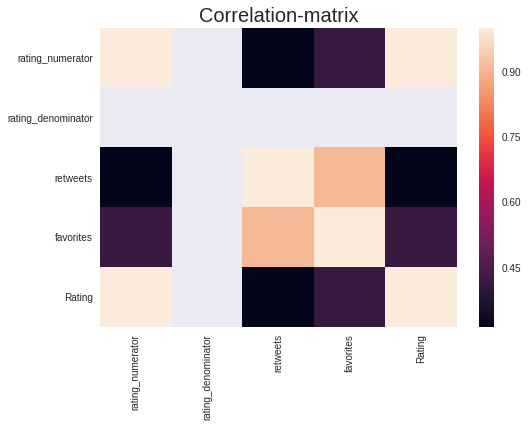

In [51]:
# Plot a heatmap for the twitter_complete dataframe
sns.heatmap(twitter_complete.corr(), fmt="d")
plt.title('Correlation-matrix', size=20)
plt.savefig('heatmap');

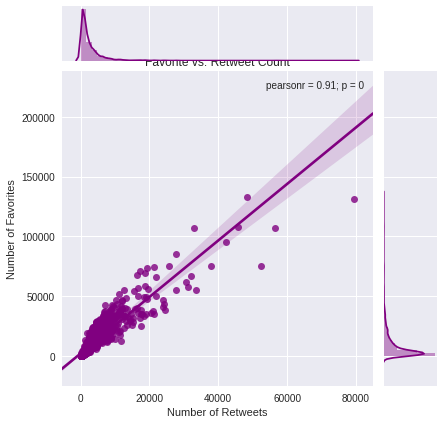

In [52]:
# Visualizing the linear relationship between retweets and favorites
sns.jointplot(x="retweets", y="favorites", data=twitter_complete,kind="reg", color="purple")
plt.title('Favorite vs. Retweet Count')
plt.xlabel('Number of Retweets')
plt.ylabel('Number of Favorites');

As expected, there is no strong correlation between two different variables except for retweets and favorites in the twitter_complete dataframe.

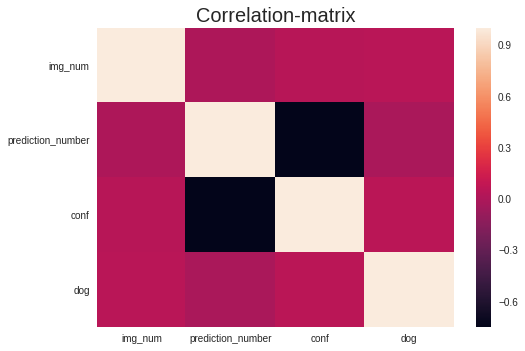

In [53]:
# Plot a heatmap for the img_pred_clean dataframe
sns.heatmap(img_pred_clean.corr(), fmt="d")
plt.title('Correlation-matrix', size=20)
plt.savefig('heatmap');

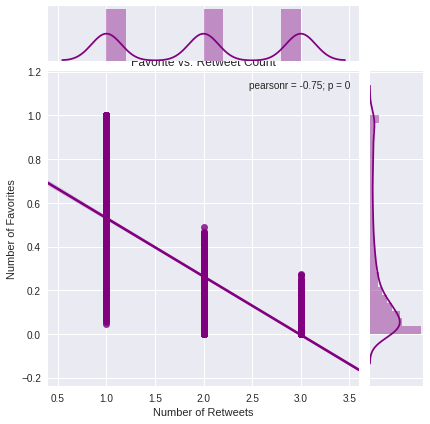

In [54]:
# Visualizing the linear relationship between retweets and favorites
sns.jointplot(x="prediction_number", y="conf", data=img_pred_clean,kind="reg", color="purple")
plt.title('Favorite vs. Retweet Count')
plt.xlabel('Number of Retweets')
plt.ylabel('Number of Favorites');

As expected, there is no strong correlation between two different variables except for Prediction_number and Confidence, as the negative correlation was already a norm in the dataset construction.

## Question 2:  Distribution of favorites, retweets and rating over time?

In [55]:
# Convert 'timestamp' column to datetime type
twitter_complete['timestamp'] = pd.to_datetime(twitter_complete['timestamp'])
# Create a new dataframe with the column 'timestamp' as the index
df_time=twitter_complete.set_index('timestamp')

In [56]:
# Show columns of the new dataframe
df_time.columns

Index(['tweet_id', 'text', 'expanded_urls', 'rating_numerator',
       'rating_denominator', 'corrected_names', 'dog_stage', 'retweets',
       'favorites', 'Rating'],
      dtype='object')

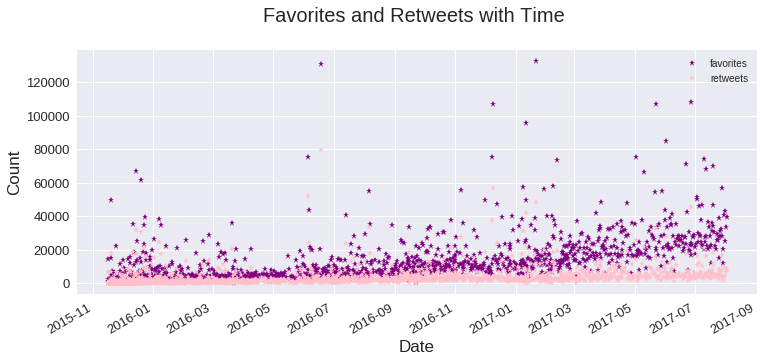

In [57]:
# Plot the distribution of Retweets and Favorites over time
plt.style.use("seaborn")
df_time[['favorites','retweets']].plot(style='*', color=['purple','pink'], figsize=(12.2,5),fontsize=13)
plt.title('Favorites and Retweets with Time \n', fontsize=20)
plt.xlabel('Date', fontsize=17)
plt.ylabel('Count', fontsize=17);

As can be seen in the plot, the number of favorites increases over time, with a moderate number of favorites in November 2015 and growing progressively over the years until September 2017.

However, there is no progressive growth in the number of retweets, which seems to decrease its density in the second semester of the year 2017.

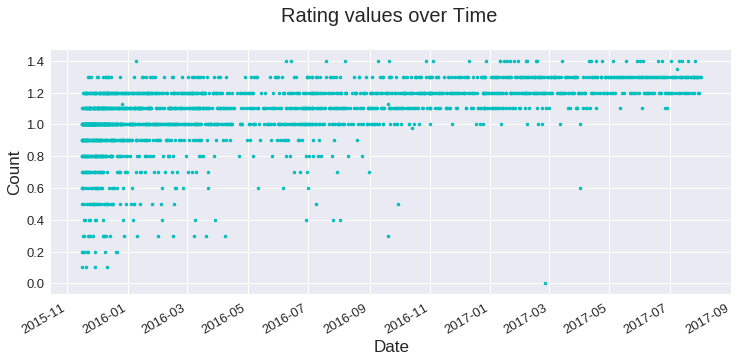

In [58]:
# Plot the distribution of Rating values over time
plt.style.use("seaborn")
df_time['Rating'].plot(style='.', color='c', figsize=(12.2,5), fontsize=13)
plt.title('Rating values over Time \n', fontsize=20)
plt.xlabel('Date' ,fontsize=17)
plt.ylabel('Count' ,fontsize=17);

In the figure above it is clearly seen how there are not ratings with values less than or equal to 0.8 (except for very specific outliers) after September 2016.

The high ratings have maintained its great popularity over time 


## Question 3: What is the distribution of the number of tweets over time?

In [59]:
# Change timestamp type to datetime
twitter_complete.timestamp = pd.to_datetime(twitter_complete['timestamp'], format='%Y-%m-%d %H:%M:%S.%f')


# Select the data containing the information for the number of tweets over time (year, month)
timed_data = twitter_complete.groupby(pd.Grouper(key = 'timestamp', freq = "M")).count().reset_index()
timed_data = timed_data[['timestamp', 'tweet_id']]


Text(0,0.5,'Number of tweets')

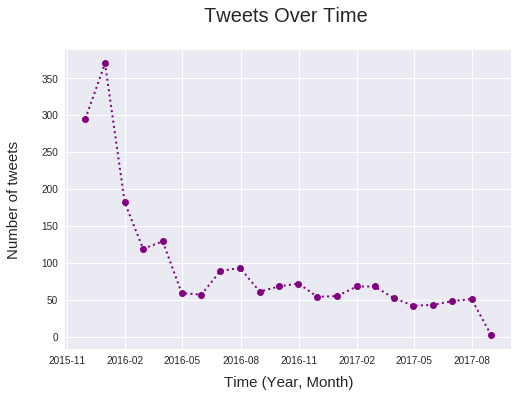

In [60]:
# Set the seaborn plotting style for the plot below
plt.style.use("seaborn")
#  Plot Tweets Over Time
plt.plot(timed_data.timestamp, timed_data.tweet_id, color='purple', 
         marker = 'o', linestyle=':', linewidth=2)
plt.title('Tweets Over Time \n', fontsize=20)
plt.xlabel("Time (Year, Month)", labelpad=10, fontsize=15)
plt.ylabel("Number of tweets", labelpad=20, fontsize=15)

The number of tweets decreases over time, showing a sharp drop in December 2016.

## Question 4: Which is the most popular dog breed?

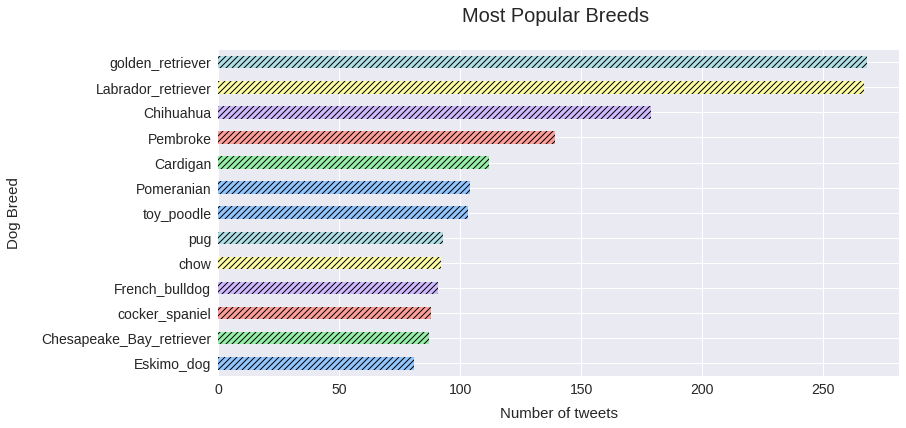

In [61]:
# Choose a seaborn style
plt.style.use("seaborn-pastel")
# Plot the Most Rated Breeds with at least more than 80 records per breed
data=img_pred_clean.groupby('pred').filter(lambda x: len(x) >= 80)
data['pred'].value_counts().sort_values().plot(kind = 'barh', fontsize=14, figsize=(12.2,6), hatch='////')
plt.title('Most Popular Breeds \n', fontsize=20)
plt.xlabel("Number of tweets", labelpad=10, fontsize=15)
plt.ylabel("Dog Breed", labelpad=20, fontsize=15);

The most popular dog breeds are Golden Retriever and Labrador Retriever, followed by Chihuahua and Pembroke.

## Question 5: What is the most popular dog name?

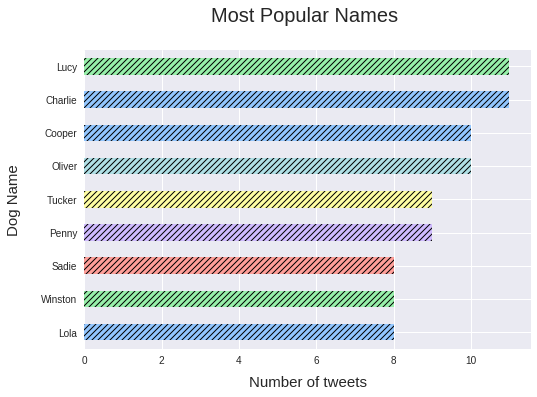

In [62]:
plt.style.use("seaborn-pastel")
df_names=twitter_complete.corrected_names.value_counts()
df_names[df_names > 7].sort_values().plot(kind='barh', legend=False, hatch='////')
plt.title('Most Popular Names \n', fontsize=20)
plt.xlabel("Number of tweets", labelpad=10, fontsize=15)
plt.ylabel("Dog Name", labelpad=20, fontsize=15);

The most popular dog names are Charlie and Lucy, followed by Cooper and Oliver.

## Question 6: What is the most popular dog stage?

Text(0,0.5,'Dog Stage')

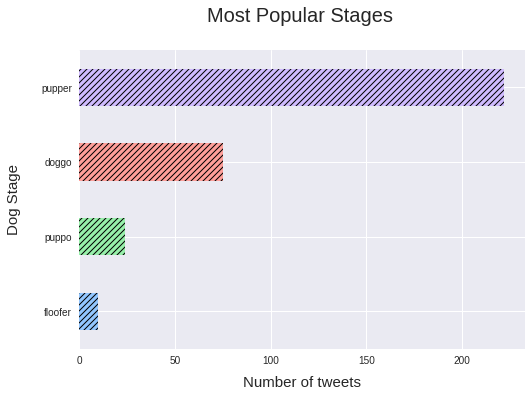

In [63]:
plt.style.use("seaborn-pastel")
df_stages=twitter_complete.dog_stage.value_counts()
df_stages.sort_values().plot(kind='barh', legend=False, hatch='////')
plt.title('Most Popular Stages \n', fontsize=20)
plt.xlabel("Number of tweets", labelpad=10, fontsize=15)
plt.ylabel("Dog Stage", labelpad=20, fontsize=15)

The most popular dog stage is by far pupper, followed by Doggo, Puppo and Floofer.

## Question 7: Which dog stage has the highest rating?

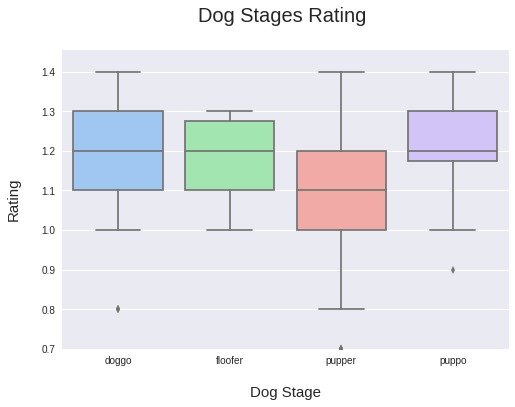

In [64]:
plt.style.use("seaborn-pastel")
sns.boxplot(x='dog_stage', y='Rating', data=twitter_complete)
plt.title('Dog Stages Rating \n', fontsize=20)
plt.xlabel('Dog Stage', labelpad=20, fontsize=15)
plt.ylabel('Rating', labelpad=20, fontsize=15)
plt.ylim(0.7,);

"Puppo" dogs got the highest rating and are the less rated, while "Puppers" got the lowest rating and are the most rated ones. 

## Question 8: Do tweets with greater rating get more retweets and favorites?

Text(0,0.5,'Number of tweets')

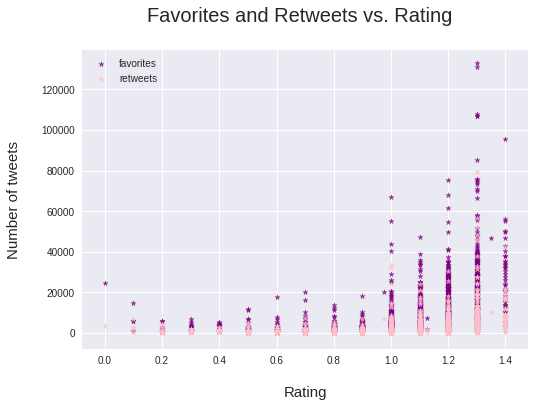

In [65]:
plt.scatter(twitter_complete.Rating, twitter_complete.favorites, alpha=0.8, c='purple', s=30, label="favorites", marker = '*')
plt.scatter(twitter_complete.Rating, twitter_complete.retweets, alpha=0.8, c='pink', s=30, label="retweets", marker = '*')
plt.legend(loc=2)
plt.title('Favorites and Retweets vs. Rating  \n', fontsize=20)
plt.xlabel('Rating', labelpad=20, fontsize=15)
plt.ylabel('Number of tweets', labelpad=20, fontsize=15)

The number of retweets and favorites increases with the Rating value, reaching the bullish peak for a rating of 13.

## Question 9: Do tweets get more retweets or favorites if they have a picture?

In [66]:
# Create a Dataframe with only true first predictions
img_pred_1 = img_pred_clean[(img_pred_clean['prediction_number']==1)&(img_pred_clean['dog'])]
# Merge twitter_complete with img_pred_1
twitter_complete_pred1 = pd.merge(twitter_complete,img_pred_1, how = 'left',on = 'tweet_id')
twitter_complete_pred1 = twitter_complete_pred1.replace({np.nan: 'No Picture' })
twitter_complete_pred1 = twitter_complete_pred1.replace({True: 'Picture'}).drop(['prediction_number','img_num'],axis=1)

twitter_complete_pred1.head(3)

,tweet_id,timestamp,text,expanded_urls,rating_numerator,rating_denominator,corrected_names,dog_stage,retweets,favorites,Rating,jpg_url,pred,conf,dog
0,892420643555336193,2017-08-01 16:23:56,This is Phineas. He's a mystical boy. Only eve...,https://twitter.com/dog_rates/status/892420643...,13,10.0,Phineas,No Picture,8853,39467,1.3,No Picture,No Picture,No Picture,No Picture
1,892177421306343426,2017-08-01 00:17:27,This is Tilly. She's just checking pup on you....,https://twitter.com/dog_rates/status/892177421...,13,10.0,Tilly,No Picture,6514,33819,1.3,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,Chihuahua,0.323581,Picture
2,891815181378084864,2017-07-31 00:18:03,This is Archie. He is a rare Norwegian Pouncin...,https://twitter.com/dog_rates/status/891815181...,12,10.0,Archie,No Picture,4328,25461,1.2,https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg,Chihuahua,0.716012,Picture


In [67]:
avg_conf=twitter_complete_pred1[twitter_complete_pred1['conf']!="No Picture"].conf.mean()
print('The average confidence level for the true picture`s prediction is:',avg_conf*100, '%')


The average confidence level for the true picture`s prediction is: 61.3978574033 %


In [68]:
ret_nopic=twitter_complete_pred1[twitter_complete_pred1['dog']=="No Picture"].retweets.sum()
ret_pic=twitter_complete_pred1[twitter_complete_pred1['dog']=="Picture"].retweets.sum()
print('The number of retweets of tweets WITH a picture is:',ret_pic)
print('The number of retweets of tweets WITHOUT a picture is:',ret_nopic)
print('The percentage difference is:',((ret_pic/(ret_nopic+ret_pic))-(ret_nopic/(ret_nopic+ret_pic)))*100,'%')

The number of retweets of tweets WITH a picture is: 4057446
The number of retweets of tweets WITHOUT a picture is: 1845634
The percentage difference is: 37.4687790103 %


In [69]:
fav_nopic=twitter_complete_pred1[twitter_complete_pred1['dog']=="No Picture"].favorites.sum()
fav_pic=twitter_complete_pred1[twitter_complete_pred1['dog']=="Picture"].favorites.sum()
print('The number of favorites of tweets WITH a picture is:',fav_pic)
print('The number of favorites of tweets WITHOUT a picture is:',fav_nopic)
print('The percentage difference is:',((fav_pic/(fav_nopic+fav_pic))-(fav_nopic/(fav_nopic+fav_pic)))*100,'%')

The number of favorites of tweets WITH a picture is: 13530488
The number of favorites of tweets WITHOUT a picture is: 5150552
The percentage difference is: 44.857973646 %


Therefore, tweets have more retweets and favorites if they include an image, also, this fact affects the favorites more.

## Question 10: Images of the Golden Retrievers (my favorite dog breed) best rated and with the most number of favorites?

In [70]:
golden_retriever_df = twitter_complete.merge(img_pred_clean.loc[img_pred_clean['pred'] == 'golden_retriever',
                                                     ['tweet_id','jpg_url','pred']],how = 'right',on = 'tweet_id')
top_golden_retriever=golden_retriever_df[(golden_retriever_df['Rating']==1.20)&(golden_retriever_df['corrected_names']!=np.nan)]
top_favs_golden_retriever=top_golden_retriever.sort_values(by = 'favorites', ascending=False)
top_favs_golden_retriever.head()

,tweet_id,timestamp,text,expanded_urls,rating_numerator,rating_denominator,corrected_names,dog_stage,retweets,favorites,Rating,jpg_url,pred
30,837820167694528512,2017-03-04 00:21:08,"Here's a pupper before and after being asked ""...",https://twitter.com/dog_rates/status/837820167...,12.0,10.0,NaN,pupper,8952.0,37277.0,1.2,https://pbs.twimg.com/media/C6CI_jbVAAA3-a1.jpg,golden_retriever
56,814153002265309185,2016-12-28 16:56:16,This is Oshie. He's ready to party. Bought tha...,https://twitter.com/dog_rates/status/814153002...,12.0,10.0,Oshie,NaN,10080.0,32000.0,1.2,https://pbs.twimg.com/media/C0xz04SVIAAeyDb.jpg,golden_retriever
87,788765914992902144,2016-10-19 15:37:03,This is Butter. She can have whatever she want...,https://twitter.com/dog_rates/status/788765914...,12.0,10.0,Butter,NaN,12014.0,30658.0,1.2,https://pbs.twimg.com/media/CvJCabcWgAIoUxW.jpg,golden_retriever
90,786963064373534720,2016-10-14 16:13:10,This is Rory. He's got an interview in a few m...,https://twitter.com/dog_rates/status/786963064...,12.0,10.0,Rory,NaN,9327.0,29725.0,1.2,https://pbs.twimg.com/media/Cuvau3MW8AAxaRv.jpg,golden_retriever
1,888917238123831296,2017-07-23 00:22:39,This is Jim. He found a fren. Taught him how t...,https://twitter.com/dog_rates/status/888917238...,12.0,10.0,Jim,NaN,4709.0,29611.0,1.2,https://pbs.twimg.com/media/DFYRgsOUQAARGhO.jpg,golden_retriever


## WINNER #1

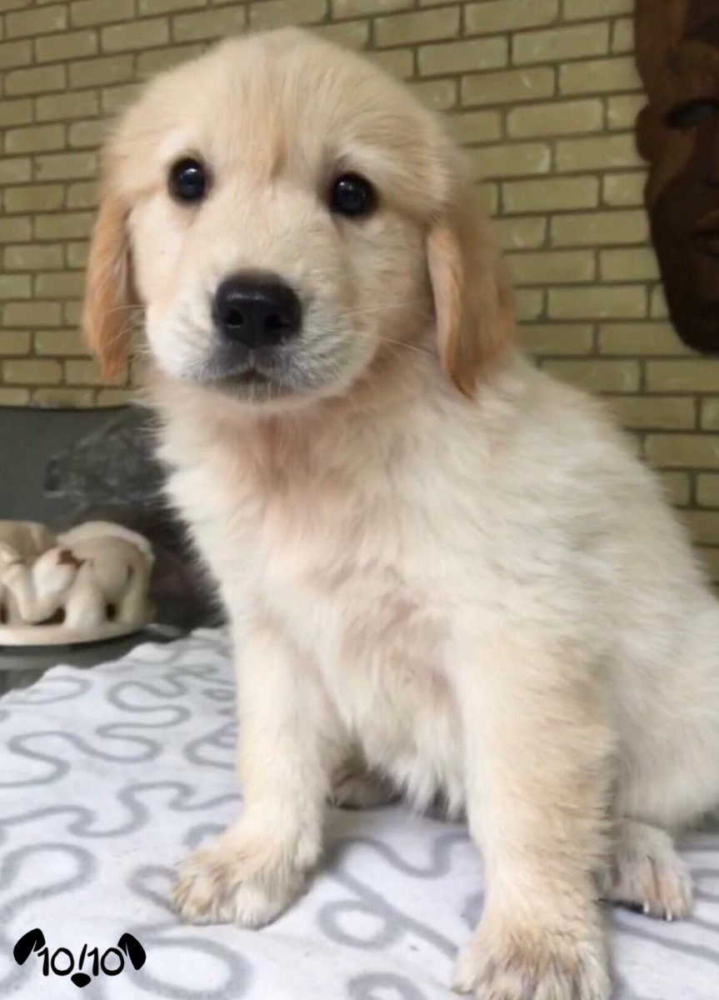

In [71]:
# Import necessary libraries
from PIL import Image
import requests
from io import BytesIO
# Display Images with request.get(url)
url_1=top_favs_golden_retriever.loc[30,'jpg_url']
response = requests.get(url_1)
Image.open(BytesIO(response.content))

## WINNER #2

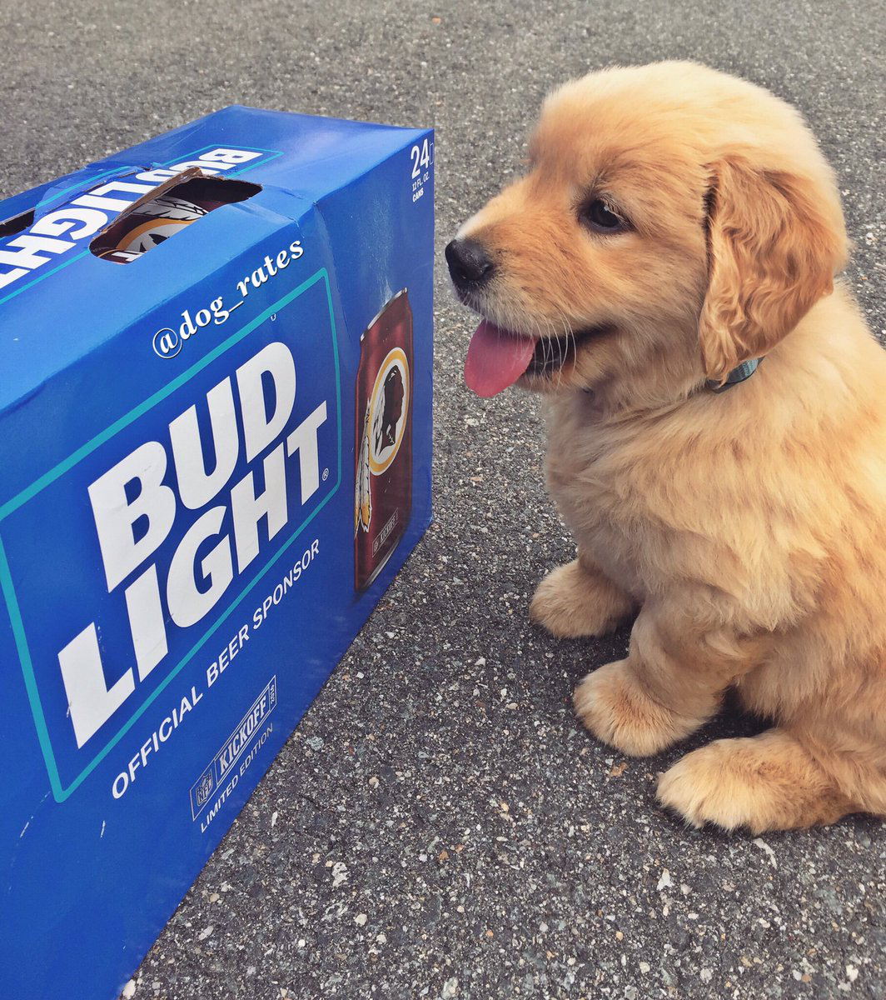

In [72]:
url_2=top_favs_golden_retriever.loc[56,'jpg_url']
response = requests.get(url_2)
Image.open(BytesIO(response.content))

## WINNER #3

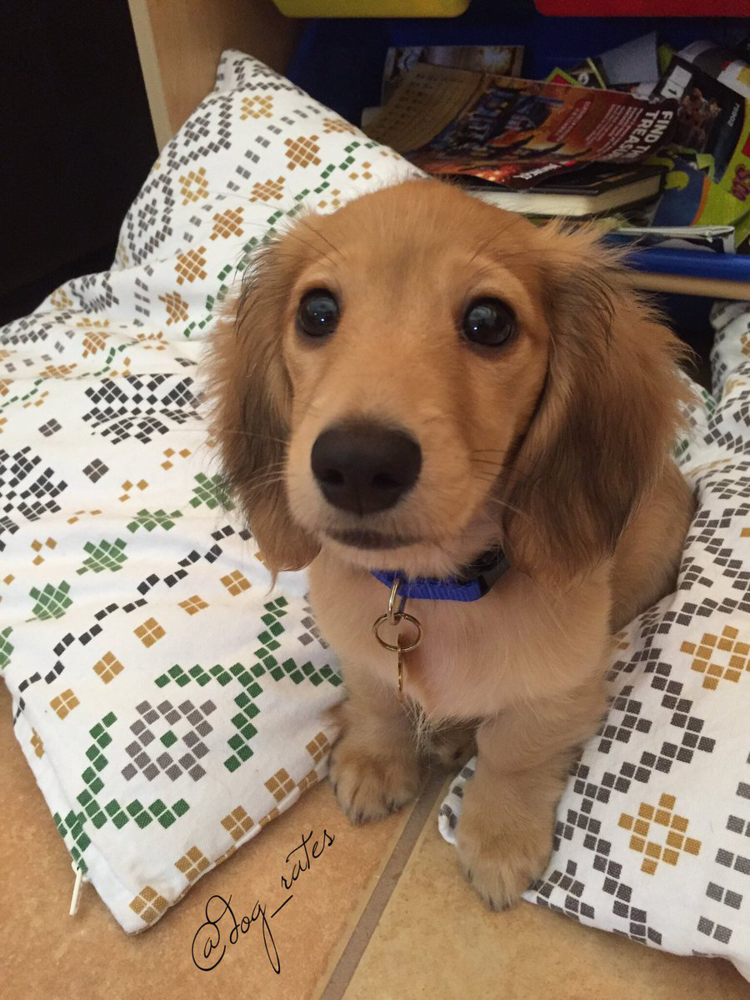

In [73]:
url_3=top_favs_golden_retriever.loc[87,'jpg_url']
response = requests.get(url_3)
Image.open(BytesIO(response.content))

## WINNER #4

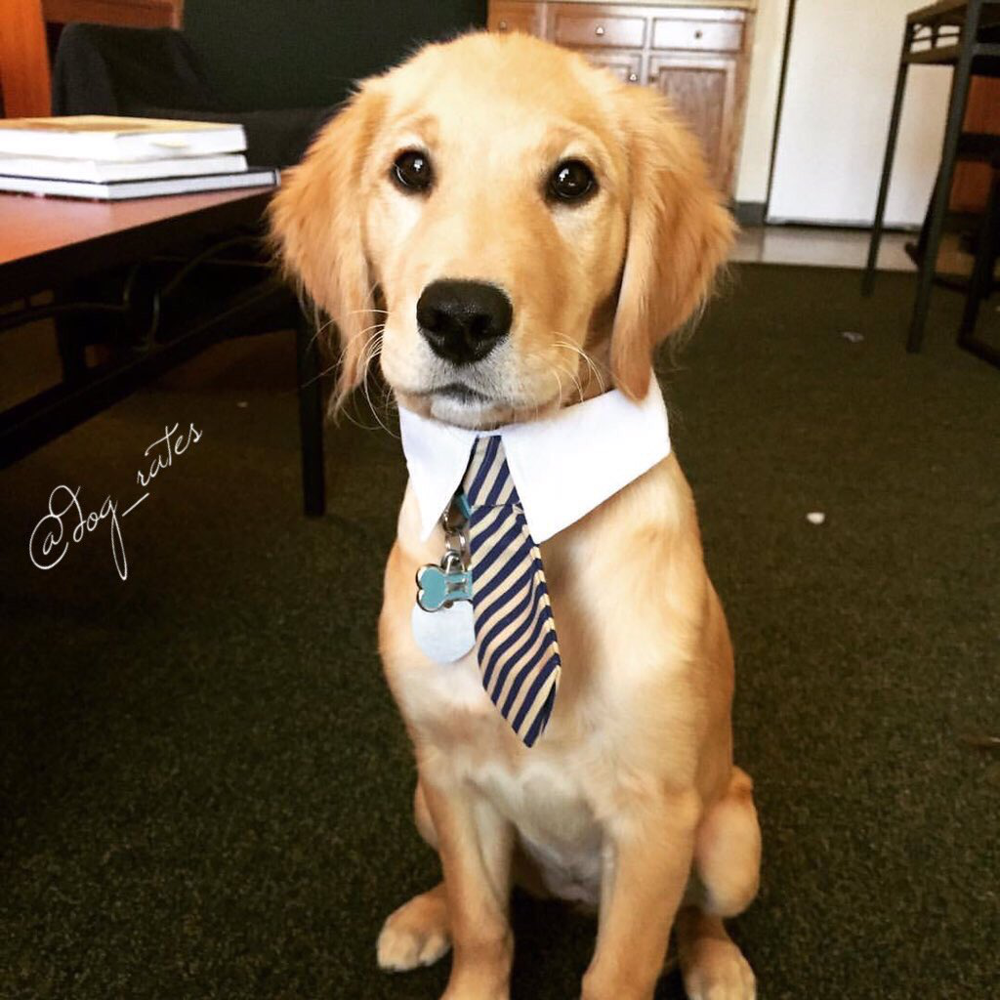

In [74]:
url_4=top_favs_golden_retriever.loc[90,'jpg_url']
response = requests.get(url_4)
Image.open(BytesIO(response.content))

## WINNER #5

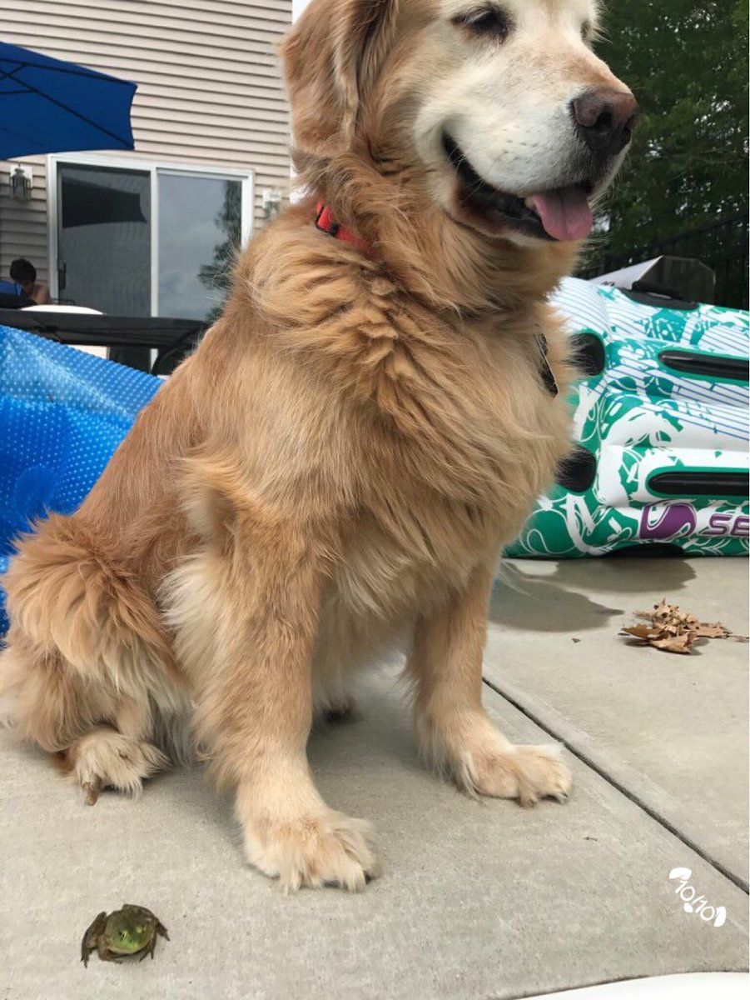

In [75]:
url_5=top_favs_golden_retriever.loc[1,'jpg_url']
response = requests.get(url_5)
Image.open(BytesIO(response.content))

<a id='Sources'></a>

## SOURCES

- https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.reset_index.html
- https://pandas.pydata.org/pandas-docs/stable/user_guide/merging.html
- https://www.w3schools.com/python/python_lambda.asp
- https://www.geeksforgeeks.org/filter-in-python/
- https://www.dataquest.io/blog/python-datetime-tutorial/
- https://realpython.com/python-matplotlib-guide/
- https://matplotlib.org/3.1.0/gallery/lines_bars_and_markers/categorical_variables.html#sphx-glr-gallery-lines-bars-and-markers-categorical-variables-py
- https://medium.com/towards-artificial-intelligence/matplotlib-complete-beginners-guide-to-line-plots-a436e18d69e4
- https://seaborn.pydata.org/generated/seaborn.jointplot.html#seaborn.jointplot
- https://stackoverflow.com/questions/7391945/how-do-i-read-image-data-from-a-url-in-python